# Long Notebook
- Team Name: Random Forest Rangers
- Member 1: Andrés Zambrano / 122532
- Member 2: Mikael Aleksander Jansen Shahly / 544897

## EDA
A complete EDA was performed, combining all data and preparing it for the ML models.
Almost all of the EDA and data preperations follows below, this was essentially not changed between submissions

In [2]:
#importing necessary datasets
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns


#Setting max display options to avoid local crashes
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

## Reading in the datasets

In [3]:
Y_train_a = pd.read_parquet('data/A/train_targets.parquet')
Y_train_b = pd.read_parquet('data/B/train_targets.parquet')
Y_train_c = pd.read_parquet('data/C/train_targets.parquet')
X_train_estimated_a = pd.read_parquet('data/A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('data/B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('data/C/X_train_estimated.parquet')
X_train_observed_a = pd.read_parquet('data/A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('data/B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('data/C/X_train_observed.parquet')
X_test_estimated_a = pd.read_parquet('data/A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('data/B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('data/C/X_test_estimated.parquet')

### Combining the datasets
A seperate combined dataset will be made for the A, B and C location.\
Each location will have a X dataset (containing only feature values) and a complete training dataset (X_train combined with the Y_train values) which can be used to check for feature correlation. 


*Note: The resolution is different between the X and Y datasets, as Y each row in Y contains an hour and each row in X is per 15 minutes. To begin with the X datset will be naivly changed to have a resolution of every hour aswell. However we will later explore feature exploration techniques to retain more data from X by creating averages of the x data*

#### Location A

In [4]:
#Create the X dataset for location A
X_train_estimated_a["estimated"] = 1.0
X_test_estimated_a["estimated"] = 1.0
X_train_observed_a["estimated"] = 0.0
X_train_observed_a["date_calc"] = X_train_observed_a["date_forecast"].copy() #date calc column added to observed data so that observed and estimated has equal nr cols

X_train_estimated_a["train/test"] = "train"
X_train_observed_a["train/test"] = "train"
X_test_estimated_a["train/test"] = "test"

X_all_a= pd.concat([X_train_observed_a, X_train_estimated_a, X_test_estimated_a], ignore_index=True)
X_all_a.set_index('date_forecast', inplace=True)

#Create the complete train dataset for location A
train_all_a = pd.concat([X_train_observed_a.drop("train/test", axis=1), X_train_estimated_a.drop("train/test", axis=1)], ignore_index=True)
train_all_a.set_index('date_forecast', inplace=True)

#remove all non hourly values
train_all_a = train_all_a[train_all_a.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_a.set_index('time', inplace=True)

#Concatenate with y data
train_all_a = pd.concat([train_all_a, Y_train_a], axis=1)

### location B

In [5]:
#Combine all data from B
X_train_estimated_b["estimated"] = 1.0
X_test_estimated_b["estimated"] = 1.0
X_train_observed_b["estimated"] = 0.0
X_train_observed_b["date_calc"] = X_train_observed_b["date_forecast"].copy()

X_train_estimated_b["train/test"] = "train"
X_train_observed_b["train/test"] = "train"
X_test_estimated_b["train/test"] = "test"

X_all_b= pd.concat([X_train_observed_b, X_train_estimated_b, X_test_estimated_b], ignore_index=True)
X_all_b.set_index('date_forecast', inplace=True)

#Create the complete train dataset for location A
train_all_b = pd.concat([X_train_observed_b.drop("train/test", axis=1), X_train_estimated_b.drop("train/test", axis=1)], ignore_index=True)
train_all_b.set_index('date_forecast', inplace=True)
#remove all non hourly values
train_all_b = train_all_b[train_all_b.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_b.set_index('time', inplace=True)

#Concatenate with y data
train_all_b = pd.concat([train_all_b, Y_train_b], axis=1)

#Drop the first row, as it is not in the X data
train_all_b.drop("2018-12-31 23:00:00", inplace=True)

Loc C

In [6]:
#Combine all data from C
X_train_estimated_c["estimated"] = 1.0
X_test_estimated_c["estimated"] = 1.0
X_train_observed_c["estimated"] = 0.0
X_train_observed_c["date_calc"] = X_train_observed_c["date_forecast"].copy()
X_train_estimated_c["train/test"] = "train"
X_train_observed_c["train/test"] = "train"
X_test_estimated_c["train/test"] = "test"

X_all_c= pd.concat([X_train_observed_c, X_train_estimated_c, X_test_estimated_c], ignore_index=True)
X_all_c.set_index('date_forecast', inplace=True)

#Create the complete train dataset for location A
train_all_c = pd.concat([X_train_observed_c.drop("train/test", axis=1), X_train_estimated_c.drop("train/test", axis=1)], ignore_index=True)
train_all_c.set_index('date_forecast', inplace=True)
#remove all non hourly values
train_all_c = train_all_c[train_all_c.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_c.set_index('time', inplace=True)

#Concatenate with y data
train_all_c = pd.concat([train_all_c, Y_train_c], axis=1)

train_all_c.drop("2018-12-31 23:00:00", inplace=True)



all locs

In [7]:
copy_a = X_all_a.copy()
copy_b = X_all_b.copy()
copy_c = X_all_c.copy()

copy_a["location"] = "A"
copy_b["location"] = "B"
copy_c["location"] = "C"
X_all = pd.concat([copy_a, copy_b, copy_c])

In [8]:
copy_a_train = train_all_a.copy()
copy_b_train = train_all_b.copy()
copy_c_train = train_all_c.copy()

copy_a_train["location"] = "A"
copy_b_train["location"] = "B"
copy_c_train["location"] = "C"

train_all = pd.concat([copy_a_train, copy_b_train, copy_c_train])

In [9]:
X_test = X_all[X_all["train/test"] == "test"]
X_test = X_test.drop("train/test", axis=1)

#### Lets start by making some quick graphs of the all the data combined

In [11]:
fig, axes = plt.subplots(nrows=16, ncols=3, figsize=(40, 140), dpi=200)
axes = axes.flatten()

for i, column in enumerate(train_all.drop("date_calc", axis=1).columns):
    sns.histplot(data=train_all[column], kde=False, ax=axes[i])
    axes[i].set_xlabel(column, fontsize = 20)

*Observations*
- Based on this is seems like snow density is completely filled with Nan values
- We have a random dip in the date forecast at the end of 2022
- Snow Density has VERY low count compared to the other features
- All the radian features have a strange distribution

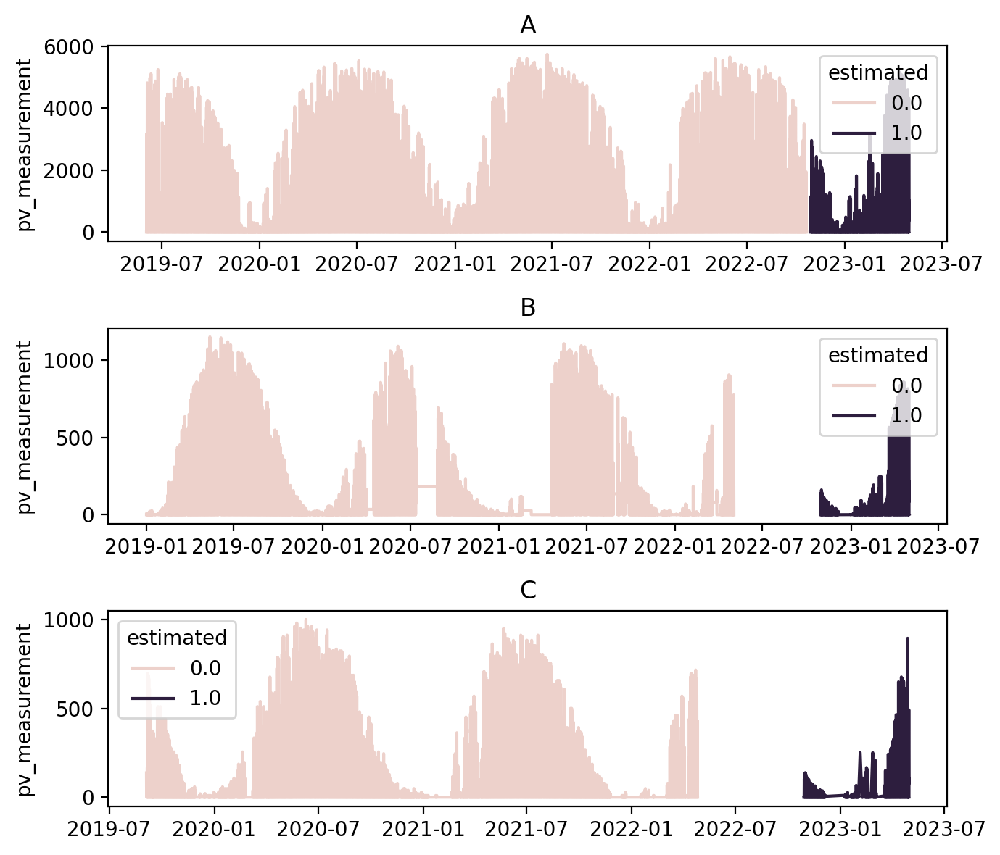

In [12]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 6), dpi=200)
feature = "pv_measurement"
sns.lineplot(data = train_all_a, y=feature, x = train_all_a.index, ax=axs[0], hue="estimated")
sns.lineplot(data = train_all_b, y=feature, x = train_all_b.index, ax=axs[1], hue="estimated")
sns.lineplot(data = train_all_c, y=feature, x = train_all_c.index, ax=axs[2], hue="estimated")
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()
plt.show()


*observation*
PV-measurements seem to have alot of duplicated values in B

#### Lets start to look at the correlation between the data and the target y values (PV measurement)

In [ ]:
plt.figure(figsize = (50, 60), dpi=200)
sns.heatmap(train_all.drop(["location"], axis=1).corr(), annot = True); 

In [13]:
train_all["date"] = train_all.index
print(train_all.drop(["location"], axis=1).corr()[["pv_measurement"]].sort_values(by="pv_measurement"))
train_all = train_all.drop("date", axis=1)

                                pv_measurement
is_in_shadow:idx                     -0.418880
air_density_2m:kgm3                  -0.275082
relative_humidity_1000hPa:p          -0.243932
wind_speed_v_10m:ms                  -0.200126
elevation:m                          -0.186294
effective_cloud_cover:p              -0.138989
total_cloud_cover:p                  -0.118089
snow_water:kgm2                      -0.086162
super_cooled_liquid_water:kgm2       -0.075641
fresh_snow_24h:cm                    -0.059904
wind_speed_10m:ms                    -0.059389
estimated                            -0.058426
snow_depth:cm                        -0.053285
precip_type_5min:idx                 -0.052279
prob_rime:p                          -0.051257
fresh_snow_12h:cm                    -0.047894
fresh_snow_6h:cm                     -0.042248
rain_water:kgm2                      -0.041471
sun_azimuth:d                        -0.041439
wind_speed_u_10m:ms                  -0.040945
precip_5min:m

#### Lets make some plots of the most correlated features

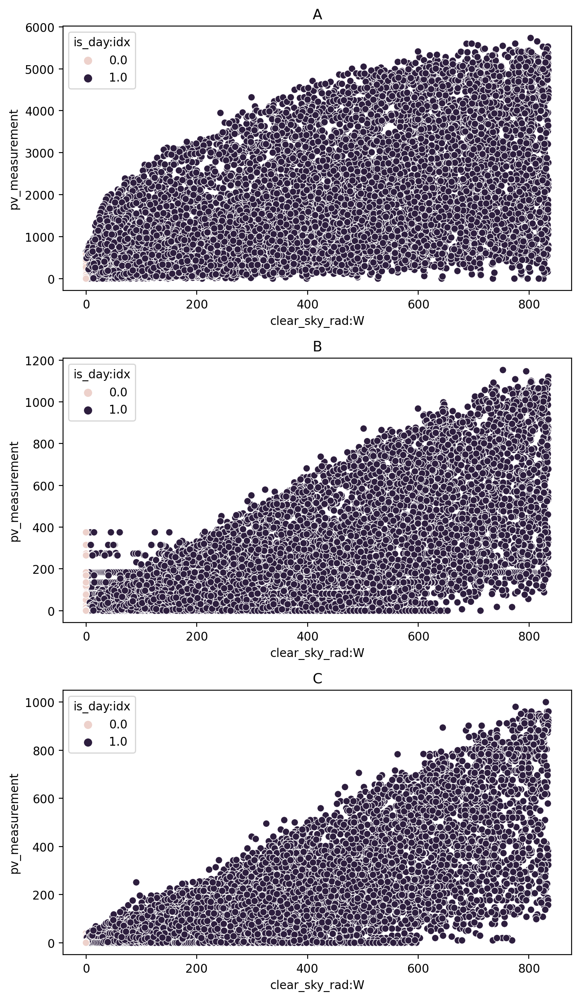

In [14]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 12), dpi=200)
y_feature = "pv_measurement"
x_feature = "clear_sky_rad:W"
sns.scatterplot(x=x_feature, y=y_feature, data=train_all_a, ax=axs[0], hue="is_day:idx")
sns.scatterplot(x=x_feature, y=y_feature, data=train_all_b, ax=axs[1], hue="is_day:idx")
sns.scatterplot(x=x_feature, y=y_feature , data=train_all_c, ax=axs[2], hue="is_day:idx")
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

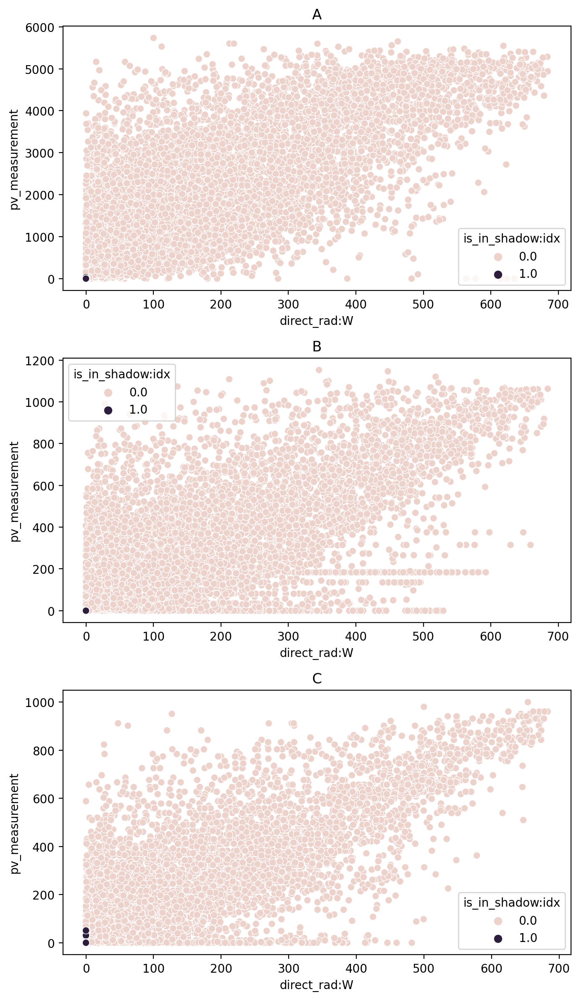

In [10]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 12), dpi=200)
y_feature = "pv_measurement"
x_feature = "direct_rad:W"
hue_feature = "is_in_shadow:idx"
sns.scatterplot(x=x_feature, y=y_feature, data=train_all_a, ax=axs[0], hue=hue_feature)
sns.scatterplot(x=x_feature, y=y_feature, data=train_all[train_all["location"] == "B"], ax=axs[1], hue=hue_feature)
sns.scatterplot(x=x_feature, y=y_feature , data=train_all[train_all["location"] == "C"], ax=axs[2], hue=hue_feature)
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

## Cleaning Data

In [15]:
train_all.isnull().sum()

absolute_humidity_2m:gm3             72
air_density_2m:kgm3                  72
ceiling_height_agl:m              21673
clear_sky_energy_1h:J                72
clear_sky_rad:W                      72
cloud_base_agl:m                   9229
dew_or_rime:idx                      72
dew_point_2m:K                       72
diffuse_rad:W                        72
diffuse_rad_1h:J                     72
direct_rad:W                         72
direct_rad_1h:J                      72
effective_cloud_cover:p              72
elevation:m                          72
fresh_snow_12h:cm                    72
fresh_snow_1h:cm                     72
fresh_snow_24h:cm                    72
fresh_snow_3h:cm                     72
fresh_snow_6h:cm                     72
is_day:idx                           72
is_in_shadow:idx                     72
msl_pressure:hPa                     72
precip_5min:mm                       72
precip_type_5min:idx                 72
pressure_100m:hPa                    72


In [16]:
train_all.drop(train_all[train_all["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)
train_all.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m              21601
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   9157
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


<AxesSubplot:>

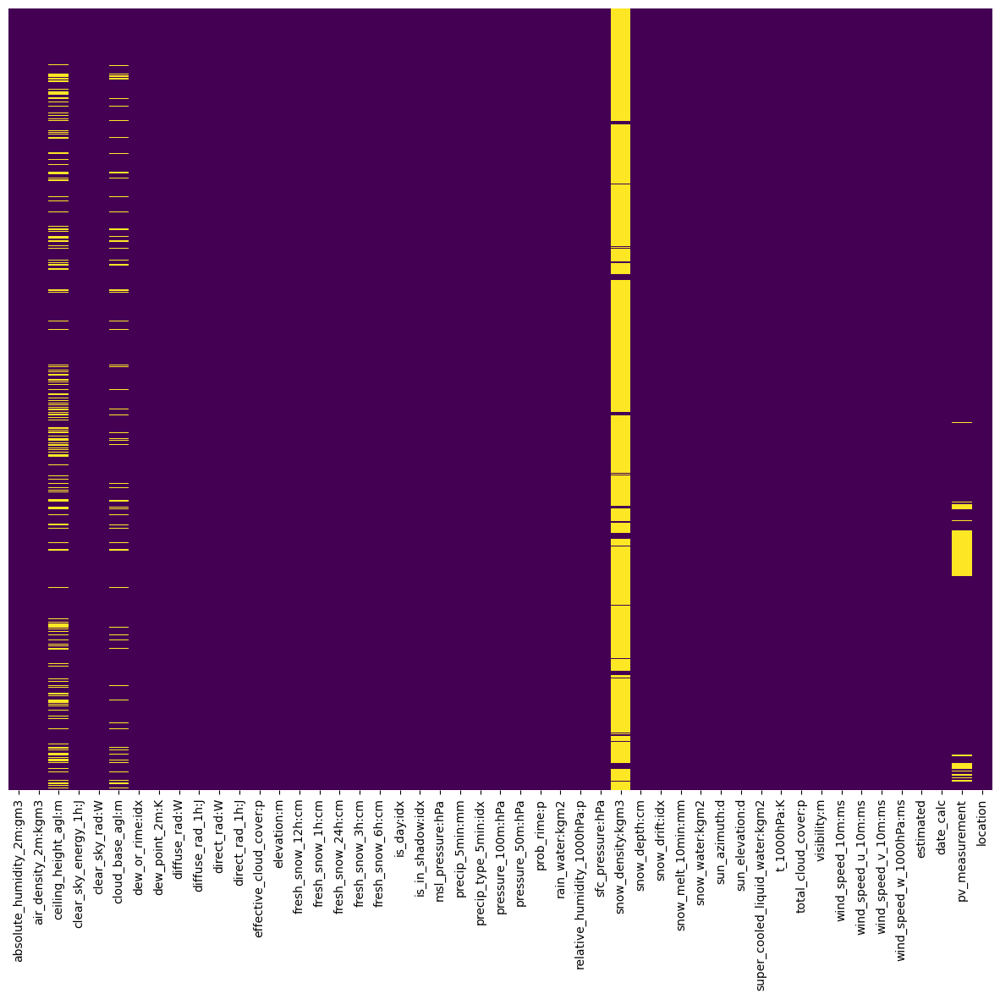

In [18]:
plt.figure(figsize=(15, 12))
sns.heatmap(train_all.isnull(), yticklabels = False, cbar = False, cmap = "viridis")

In [ ]:
#### Dropping snow density column in test and train
train_all = train_all.drop(["snow_density:kgm3"], axis=1)
X_test= X_test.drop(["snow_density:kgm3"], axis=1)

### Saving datasets with Nan values except for in target value and snow density

In [ ]:
train_all_pv_cleaned = train_all.dropna(axis=0, subset=["pv_measurement"])

In [ ]:
X_train_all_pv_cleaned = train_all_pv_cleaned.drop(["pv_measurement", "date_calc"], axis=1)
Y_train_all_pv_cleaned = train_all_pv_cleaned[['pv_measurement']]
X_test_non_cleaned = X_test.drop("date_calc", axis=1)

In [ ]:
#Making y_train for each dataset
Y_train_all_pv_cleaned_a = train_all_pv_cleaned[train_all_pv_cleaned["location"] == "A"][["pv_measurement"]]
Y_train_all_pv_cleaned_b = train_all_pv_cleaned[train_all_pv_cleaned["location"] == "B"][["pv_measurement"]]
Y_train_all_pv_cleaned_c = train_all_pv_cleaned[train_all_pv_cleaned["location"] == "C"][["pv_measurement"]]

In [ ]:
#Saving the datasets
X_train_all_pv_cleaned.to_parquet("data/prepared_datasets/summer/X_train.parquet")
Y_train_all_pv_cleaned.to_parquet("data/prepared_datasets/summer/Y_train.parquet")
Y_train_all_pv_cleaned_a.to_parquet("data/prepared_datasets/summer/Y_train_a.parquet")
Y_train_all_pv_cleaned_b.to_parquet("data/prepared_datasets/summer/Y_train_b.parquet")
Y_train_all_pv_cleaned_c.to_parquet("data/prepared_datasets/summer/Y_train_c.parquet")
X_test_non_cleaned.to_parquet("data/prepared_datasets/summer/X_test.parquet")

### NOTE: the prev script can be rerun to tweak the data and saved to new folders. THis is consistently done in submissions to test new versions of the data and is explained below. The functions that change the data are breifly given here:

*Note* These functions were created with the help of chatGPT

In [ ]:
#Creating an average of the X-data every 15 min to an averagled hour value
def resample_df_no_categorical(df, hourly_df):
    indices_to_keep = hourly_df.index
    resampled_df = df.resample('1H').mean()
    resampled_df = resampled_df[resampled_df.index.isin(indices_to_keep)]
    return resampled_df

In [ ]:
def remove_duplicates_over_threshold(df, threshold, col):
    threshold = 4  # Set your threshold here

    # Create a boolean mask to identify consecutive duplicates (non-zero values)
    mask = df[col].ne(df[col].shift()).cumsum()

    # Create a mask to identify rows that need to be kept (consecutive zeros, first in a group, or the first row of a group)
    rank_within_group = df.groupby(mask)[col].rank(method='first')
    keep_mask = (df[col] == 0) | (rank_within_group <= threshold - 1) | (mask != mask.shift())

    # Filter the DataFrame based on the keep_mask
    df_filtered = df[keep_mask]
    return df_filtered

In [ ]:
def remove_duplicates_over_threshold_under_val(df, col, threshold, val):
    # Define the threshold
    threshold

    # Create a boolean mask for values less than 1
    mask = df[col] < val

    # Use cumulative sum to identify consecutive groups of values less than 1
    groups = (mask != mask.shift()).cumsum()

    # Filter out groups that don't meet the threshold
    valid_groups = groups[mask].value_counts() >= threshold
    valid_mask = groups.map(valid_groups.get).fillna(False)

    # Select rows that meet the criteria
    filtered_df = df[~valid_mask]
    return filtered_df

Simply running these on the train_all data and saving it to different data folders, is how the different datasets in all submissions were made

## 1. Random prediction
For the first prediction we experimented with and creating a submission with random values to set as a baseline for future attempts.

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

In [ ]:
def list_directory_tree_with_os_walk(starting_directory):
    for root, directories, files in os.walk(starting_directory):
        print(f"Directory: {root}")
        for file in files:
            print(f"  File: {file}")

list_directory_tree_with_os_walk('.')

In [ ]:
train_a = pd.read_parquet('data/A/train_targets.parquet')
train_b = pd.read_parquet('data/B/train_targets.parquet')
train_c = pd.read_parquet('data/C/train_targets.parquet')

In [ ]:
X_train_estimated_a = pd.read_parquet('data/A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('data/B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('data/C/X_train_estimated.parquet')

In [ ]:
X_train_observed_a = pd.read_parquet('data/A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('data/B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('data/C/X_train_observed.parquet')

In [ ]:
X_test_estimated_a = pd.read_parquet('data/A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('data/B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('data/C/X_test_estimated.parquet')

In [ ]:
test = pd.read_csv('data/test.csv')
test

In [ ]:
sample_submission = pd.read_csv('data/sample_submission.csv')
sample_submission

In [ ]:
# Example, let the predictions be random values
test['prediction'] = np.random.rand(len(test))
sample_submission = sample_submission[['id']].merge(test[['id', 'prediction']], on='id', how='left')
sample_submission.to_csv('my_first_submission.csv', index=False)

## 2. Decision Tree
The second submission was based on the previous code but now using a basic Decision Tree regressor from SKLearn.

#### Making combined dataframes

In [ ]:
#Remove all non hourly values
X_train_all_a.set_index('date_forecast', inplace=True)
mask = X_train_all_a.index.minute == 0
X_train_all_a = X_train_all_a[mask]

#### Making the Model

In [ ]:
X = data.drop(["pv_measurement",'date_calc'], axis=1)
y = data.pv_measurement

model = DecisionTreeRegressor(random_state=1)
model.fit(X, y)
predictions = model.predict(X_test_a.drop(['date_forecast', 'date_calc'], axis=1))
print(predictions)

In [ ]:
test = pd.read_csv('data/test.csv')
sample_submission = pd.read_csv('data/sample_submission.csv')
test['prediction'] = np.random.rand(len(test))
test.prediction[0..predictions.size] = predictions
sample_submission = sample_submission[['id']].merge(test[['id', 'prediction']], on='id', how='left')
sample_submission.to_csv('my_first_submission.csv', index=False)

## In the following submission the combined datasets were used (as shown above in the EDA section for train_all_a, train_all_b, train_all_c). No other functions were run on this data, simply combining it following the same code as the first few cells on EDA section

#### We also did some custom data cleanup on these training sets

In [ ]:
data_a = train_all_a.dropna(axis=0).drop(['date_calc', 'estimated'], axis=1)
data_b = train_all_b.dropna(axis=0).drop(['date_calc', 'estimated'], axis=1)
data_c = train_all_c.dropna(axis=0).drop(['date_calc', 'estimated'], axis=1)

## Decision Tree Test

In [ ]:
from sklearn.tree import DecisionTreeRegressor 

X_t = data_a.drop('pv_measurement',axis=1)
y_t = data_a.pv_measurement
model = DecisionTreeRegressor(random_state=1)
model.fit(X_t, y_t)
X_p = X_test_estimated_a.drop(['date_forecast', 'date_calc', 'estimated', 'train/test'], axis = 1)
predictions = model.predict(X_p)
out_pd = pd.concat([X_test_estimated_a.date_forecast, pd.DataFrame(predictions)], axis=1)
out_pd=out_pd.rename(columns = {0:'prediction','date_forecast':'time'})
out_pd['location'] = 'A'
out_pd.set_index('time',inplace=True)

### Create submission

In [ ]:
test = pd.read_csv('data/test.csv')
test.time = pd.to_datetime(test.time)
sample_submission = pd.read_csv('data/sample_submission.csv')
# test['prediction'] = np.random.rand(len(test))
test.set_index('time',inplace=True)
df1 = test
df2 = out_pd

merged_df = df1.reset_index().merge(df2.reset_index(), on=['time', 'location'], how='left', suffixes=('_original', '_new'))

# # Use combine_first to replace NaN values in 'prediction_new' with the original 'prediction' values
merged_df['prediction_new'] = merged_df['prediction_new'].combine_first(merged_df['prediction_original'])

# # Drop the original 'prediction' column
merged_df.drop('prediction_original', axis=1, inplace=True)

# # Rename 'prediction_new' to 'prediction'
merged_df.rename(columns={'prediction_new': 'prediction'}, inplace=True)

sample_submission = sample_submission[['id']].merge(merged_df[['id', 'prediction']], on='id', how='left')
sample_submission.to_csv('my_first_submission.csv', index=False)

Submit

In [ ]:
# kaggle competitions submit -c solar-energy-production-forecasting -f submission.csv -m "Message"

## 4. Autosklearn Classifier
We then tried to improve the code from above by using AutoSKLearn, in this case it is mistakenly a classifier. Most of the code remains the same but using a different model.

In [ ]:
import autosklearn.classification

X_t = data_a.drop('pv_measurement',axis=1)
y_t = data_a.pv_measurement
model = autosklearn.classification.AutoSklearnClassifier(random_state=1)
model.fit(X_t, y_t)
X_p = X_test_estimated_a.drop(['date_forecast', 'date_calc', 'estimated', 'train/test'], axis = 1)
predictions = model.predict(X_p)
out_pd = pd.concat([X_test_estimated_a.date_forecast, pd.DataFrame(predictions)], axis=1)
out_pd=out_pd.rename(columns = {0:'prediction','date_forecast':'time'})
out_pd['location'] = 'A'
out_pd.set_index('time',inplace=True)

## 5. Python script
For the next few attempts, we moved to a Python script to try different models, this initial script now uses the Decision Tree regressor that is more suitable for our scenario. It also contains extra helper functions and better formatting with the help from ChatGPT. Here we started to also do some model evaluation with included cross-validation functions.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
import subprocess
import argparse

def execute_cmd(command):
    """
    Execute a command using the command line.
    
    Parameters:
    - command (str): The command to be executed.

    Returns:
    - str: The output of the command.
    """
    try:
        # Run the command and get the output
        result = subprocess.check_output(command, shell=True, stderr=subprocess.STDOUT, text=True)
        return result.strip()
    except subprocess.CalledProcessError as e:
        # If the command returns a non-zero exit code, an exception will be raised.
        # Here, we catch the exception and return the error output.
        return e.output.strip()

def one_hot_to_categorical(df, col1, col2):
    """
    Convert one-hot encoded columns to a single categorical column.
    
    Parameters:
    - df: DataFrame containing the one-hot encoded columns.
    - col1: Name of the first one-hot encoded column.
    - col2: Name of the second one-hot encoded column.

    Returns:
    - A DataFrame with the categorical values.
    """
    conditions = [
        (df[col1] == 1),
        (df[col2] == 1)
    ]
    choices = [col1, col2]
    result_df = pd.DataFrame({
        'Category': np.select(conditions, choices, default='A')
    })
    return result_df

def load_datasets():
    X_test  = pd.read_parquet('data/prepared_datasets/no_Nan_hotone_encoding/X_test.parquet')
    X_train = pd.read_parquet('data/prepared_datasets/no_Nan_hotone_encoding/X_train.parquet')
    Y_train = pd.read_parquet('data/prepared_datasets/no_Nan_hotone_encoding/Y_train.parquet')
    return X_train, Y_train, X_test

def train_and_predict(X_train, Y_train, X_test):
    model = DecisionTreeRegressor(random_state=1)
    scores = cross_val_score(model, X_train, Y_train, cv=5)
    print("Cross-validation scores:", scores)
    print("Average cross-validation score:", scores.mean())
    model.fit(X_train, Y_train)
    predictions = model.predict(X_test)
    return predictions

def prepare_submission(predictions, X_test):
    pd_predictions = pd.DataFrame(predictions)
    index_df = X_test.index.to_frame()
    out_pd = pd.concat([index_df.reset_index(drop=True), pd_predictions.reset_index(drop=True)], axis=1)
    out_pd = out_pd.rename(columns={0: 'prediction', 'date_forecast': 'time'})
    out_pd['location'] = one_hot_to_categorical(X_test, 'B', 'C')
    out_pd.set_index('time', inplace=True)
    return out_pd

def merge_with_sample(out_pd):
    test = pd.read_csv('data/test.csv')
    test.time = pd.to_datetime(test.time)
    sample_submission = pd.read_csv('data/sample_submission.csv')
    test.set_index('time', inplace=True)
    
    merged_df = test.reset_index().merge(out_pd.reset_index(), on=['time', 'location'], how='left', suffixes=('_original', '_new'))
    merged_df['prediction_new'] = merged_df['prediction_new'].combine_first(merged_df['prediction_original'])
    merged_df.drop('prediction_original', axis=1, inplace=True)
    merged_df.rename(columns={'prediction_new': 'prediction'}, inplace=True)
    return sample_submission[['id']].merge(merged_df[['id', 'prediction']], on='id', how='left')

def main():
    pd.set_option('display.max_rows', 200)
    pd.set_option('display.max_columns', 200)
    
    X_train, Y_train, X_test = load_datasets()
    predictions = train_and_predict(X_train, Y_train, X_test)
    out_pd = prepare_submission(predictions, X_test)
    sample_submission = merge_with_sample(out_pd)
    sample_submission.to_csv('submission.csv', index=False)

if __name__ == "__main__":
    parser = argparse.ArgumentParser(description="Prints the provided string.")
    parser.add_argument("-m", "--message", type=str, help="Kaggle submission message.")
    args = parser.parse_args()
    main()
    if args.message:
        execute_cmd(f'kaggle competitions submit -c solar-energy-production-forecasting -f submission.csv -m "{args.message}"')

## 6. AutoML repeat
Now we added the AutoML we tried a few attempts ago into the script to compare. Here AutoML tried for a long time to obtain the best model possible.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
import subprocess
import argparse
from sklearn.metrics import mean_squared_error
import autosklearn.regression

def train_and_predict(X_train, y_train, X_test, model_type="regressor"):
    """
    Train and predict.

    Parameters:
    - X_train: Training features
    - y_train: Training labels/targets
    - X_test: Test features
    - model_type (str): Either "regressor" for Decision Tree or "automl" for auto-sklearn.

    Returns:
    - DataFrame: Predictions
    """
    if model_type == "regressor":
        model = DecisionTreeRegressor(random_state=1)
    elif model_type == "automl":
        model = autosklearn.regression.AutoSklearnRegressor(
            time_left_for_this_task=600,
            per_run_time_limit=60,
            n_jobs=-1,
            tmp_folder="/tmp/autosklearn_classification_example_tmp",
        )
    else:
        raise ValueError(f"Invalid model_type: {model_type}. Expected 'regressor' or 'classifier'.")

    scores = cross_val_score(model, X_train, y_train, cv=5)
    print("Cross-validation scores:", scores)
    print("Average cross-validation score:", scores.mean())
    
    model.fit(X_train, y_train)
    return pd.DataFrame(predictions)

def validate(predicted_df, target_df):
    train_targets = pd.read_parquet('data/A/train_targets.parquet')
    
    # Check if the number of samples in df and train_targets are the same
    if len(predicted_df) != len(target_df):
        raise ValueError(f"Validate: Inconsistent number of samples: predicted_df has {len(predicted_df)} samples while target_df has {len(target_df)} samples.")
    
    target_df.time = pd.to_datetime(target_df.time)
    target_df.set_index('time', inplace=True)

    # Set the 'time' column of df to match the index of target_df
    predicted_df.time = pd.to_datetime(target_df.index)

    # Compute RMSE
    rmse = mean_squared_error(target_df, predicted_df, squared=False)
    return rmse

## 7. Initial Catboost & XGBoost
This is our first attempt to explore the possibility to use CatBoost and XGBoost. We added the two tools to the script and did a couple submissions to see their potential

In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
import subprocess
import argparse
from sklearn.metrics import mean_squared_error
import autosklearn.regression
from catboost import Pool, CatBoostRegressor
from xgboost import XGBRegressor

def train_and_predict(X_train, y_train, X_test, model_type="regressor"):
    """
    Train and predict.

    Parameters:
    - X_train: Training features
    - y_train: Training labels/targets
    - X_test: Test features
    - model_type (str): Either "regressor" for Decision Tree or "automl" for auto-sklearn.

    Returns:
    - DataFrame: Predictions
    """
    if model_type == "regressor":
        model = DecisionTreeRegressor(random_state=1)
    elif model_type == "automl":
        model = autosklearn.regression.AutoSklearnRegressor(
            time_left_for_this_task=600,
            per_run_time_limit=60,
            n_jobs=-1,
            tmp_folder="/tmp/autosklearn_classification_example_tmp"
        )
    elif model_type == "catboost":
        model = CatBoostRegressor()
    elif model_type == 'xgboost':
        model = XGBRegressor()
    else:
        raise ValueError(f"Invalid model_type: {model_type}. Expected 'regressor' or 'classifier'.")

    scores = cross_val_score(model, X_train, y_train, cv=5)
    print("Cross-validation scores:", scores)
    print("Average cross-validation score:", scores.mean())
    
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    try:
        print(model.show_models())
        print(model.leaderboard())
        # print("MSE:", mean_squared_error(y_test, predictions))
        print(model.get_configuration_space(X_train, y_train))
    except:
        print("")
    return pd.DataFrame(predictions)

## 8. Catboost Update
Catboost produced good results so we tried to perform some data engineering to improve it and update some of its parameters.

In [ ]:
def load_datasets():
    X_test  = pd.read_parquet('data/prepared_datasets/non_cleaned/X_test.parquet')
    X_train = pd.read_parquet('data/prepared_datasets/non_cleaned/X_train.parquet')
    y_train = pd.read_parquet('data/prepared_datasets/non_cleaned/Y_train.parquet')
    return X_train, y_train, X_test

def train_and_predict(X_train, y_train, X_test, model_type="regressor"):
    """
    Train and predict.

    Parameters:
    - X_train: Training features
    - y_train: Training labels/targets
    - X_test: Test features
    - model_type (str): Either "regressor" for Decision Tree or "automl" for auto-sklearn.

    Returns:
    - DataFrame: Predictions
    """
    if model_type == "regressor":
        model = DecisionTreeRegressor(random_state=1)
    elif model_type == "automl":
        model = autosklearn.regression.AutoSklearnRegressor(
            time_left_for_this_task=600,
            per_run_time_limit=60,
            n_jobs=-1,
            tmp_folder="/tmp/autosklearn_classification_example_tmp"
        )
    elif model_type == "catboost":
        cat_features = ['location']
        model = CatBoostRegressor(
            cat_features=cat_features,
            verbose=100
        )

## 9. Catboost trained for different locations
This attempt we checked the possibility of stacking the catboost models fitted to each location separately.

In [ ]:
X_test_A = None
X_test_B = None
X_test_C = None
X_train_A = None
X_train_B = None
X_train_C = None
y_train_A = None
y_train_B = None
y_train_C = None

def load_datasets():
    X_test  = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_test.parquet')
    X_test_A = X_test[X_test['location'] == 'A']
    X_test_B = X_test[X_test['location'] == 'B']
    X_test_C = X_test[X_test['location'] == 'C']
    X_train = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_train.parquet')
    X_train_A = X_train[X_train['location'] == 'A']
    X_train_B = X_train[X_train['location'] == 'B']
    X_train_C = X_train[X_train['location'] == 'C']
    y_train = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train.parquet')
    y_train_A = y_train[y_train['location'] == 'A']
    y_train_B = y_train[y_train['location'] == 'B']
    y_train_C = y_train[y_train['location'] == 'C']

In [ ]:
    elif model_type == "catboost":
        cat_features = ['location']
        
        model = CatBoostRegressor(
            cat_features=cat_features,
            verbose=100
        )
        model_B = CatBoostRegressor(
            cat_features=cat_features,
            verbose=100
        )
        
        model_C = CatBoostRegressor(
            cat_features=cat_features,
            verbose=100
        )

In [ ]:
  # scores = cross_val_score(model, X_train, y_train, cv=5)
    # print("Cross-validation scores:", scores)
    # print("Average cross-validation score:", scores.mean())
    
    # model.fit(X_train, y_train)
    # predictions = model.predict(X_test)
    
    model.fit(X_train_A, y_train_A)
    predictions1 = model.predict(X_test_A)
    
    ts = TimeSeriesSplit(n_splits = 10)
    cross_val_score(model, X_train_A, y_train_A, cv=ts, scoring='neg_mean_absolute_error')
    
    model_B.fit(X_train_B, y_train_B)
    predictions2 = model_B.predict(X_test_B)
        
    model_C.fit(X_train_C, y_train_C)
    predictions3 = model_C.predict(X_test_C)
        
    predictions = np.concatenate([predictions1, predictions2, predictions3])

### Stacked A & B + C Catboost
We also tried stacking A and he merged B and C location since A was much more different from the B and C datasets.

In [ ]:
model_B.fit(pd.concat([X_train_B,X_train_C], axis=0), pd.concat([y_train_B, y_train_C],axis=0))
predictions2 = model_B.predict(pd.concat([X_test_B, X_test_C],axis=0))
    
predictions = np.concatenate([predictions1, predictions2])

#### In the following submissions, we created a submission simply by running the functions below
- These are the same functions as used in scripts below, just highlighted here

In [ ]:
def prepare_submission(predictions, X_test):
    index_df = X_test.index.to_frame()
    out_pd = pd.concat([index_df.reset_index(drop=True), predictions.reset_index(drop=True)], axis=1)
    out_pd = out_pd.rename(columns={0: 'prediction', 'date_forecast': 'time'})
    print(X_test.info())
    print(out_pd.info())
    out_pd['location'] = X_test['location'].reset_index(drop=True)
    out_pd.set_index('time', inplace=True)
    return out_pd

def merge_with_sample(out_pd):
    test = pd.read_csv('data/test.csv')
    test.time = pd.to_datetime(test.time)
    sample_submission = pd.read_csv('data/sample_submission.csv')
    test.set_index('time', inplace=True)
    
    merged_df = test.reset_index().merge(out_pd.reset_index(), on=['time', 'location'], how='left', suffixes=('_original', '_new'))
    merged_df['prediction_new'] = merged_df['prediction_new'].combine_first(merged_df['prediction_original'])
    merged_df.drop('prediction_original', axis=1, inplace=True)
    merged_df.rename(columns={'prediction_new': 'prediction'}, inplace=True)
    return sample_submission[['id']].merge(merged_df[['id', 'prediction']], on='id', how='left')


out_pd = prepare_submission(predictions, X_test)
sample_submission = merge_with_sample(out_pd)
sample_submission.to_csv('submission.csv', index=False)

## 10. submission for running catboost only, with more cleaned data
- a standard catboost was run, but this time the feature rows containing only Nans were removed ()
- simply done with the code:
train_all.drop(train_all[train_all["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)
- Then rerun the catboost with this data
- The non averaged dataset was used

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_test.parquet')
X_train = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_train.parquet')
y_train = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train.parquet')
y_train_a = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_a.parquet')
y_train_b = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_b.parquet')
y_train_c = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_c.parquet')

In [ ]:
#Create a pool of data
train_pool = Pool(X_train, y_train, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

cat_feature = ["location"]

#init model and fit it
catboost_model = CatBoostRegressor()
catboost_model.fit(train_pool)
predictions = pd.DataFrame(catboost_model.predict(test_pool))

#### 11. continuing to use catboost with some feature engineering
- We then attempted to remove the snow density column (see EDA above for code for this) and added a month column as acategorical string val
- resulted in much worse scores
- The non avg data was used
- We never used the month col after this
- Code for this below

In [ ]:
train_all['month'] = train_all.index.strftime('%B') #code to make a str month col

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_test.parquet')
X_train = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_train.parquet')
y_train = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train.parquet')
y_train_a = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_a.parquet')
y_train_b = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_b.parquet')
y_train_c = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_c.parquet')

In [ ]:
#Create a pool of data
train_pool = Pool(X_train, y_train, cat_features=["location", "month"])
test_pool = Pool(X_test, cat_features=["location", "month"]) 

cat_feature = ["location", "month"]

#init model and fit it
catboost_model = CatBoostRegressor()
catboost_model.fit(train_pool)
predictions = pd.DataFrame(catboost_model.predict(test_pool))

## 12. Continuing to update catboost with some feature engineering on data
- We then attempted to drop the month col and also keep the snow density dropped
- afterwards we attempted to remove the cols from the dataframe with low correlation, these cols that were dropped (and there correlation to the pv vals were)

In [ ]:
wind_speed_u_10m:ms                  -0.040945
precip_5min:mm                       -0.038228
fresh_snow_3h:cm                     -0.037278
fresh_snow_1h:cm                     -0.031325
snow_melt_10min:mm                   -0.018329
dew_or_rime:idx                      -0.009610
snow_drift:idx                       -0.001738
wind_speed_w_1000hPa:ms               0.002152
date_calc                             0.009827

We then simply retrained a catboost model with these cols dropped with the default hyperparams (just as before)
- non-avg dataset was used

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_test.parquet')
X_train = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_train.parquet')
y_train = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train.parquet')
y_train_a = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_a.parquet')
y_train_b = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_b.parquet')
y_train_c = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_c.parquet')

In [ ]:
#Create a pool of data
train_pool = Pool(X_train, y_train, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

cat_feature = ["location"]

#init model and fit it
catboost_model = CatBoostRegressor()
catboost_model.fit(train_pool)
predictions = pd.DataFrame(catboost_model.predict(test_pool))

## 13. remove the estimated col and continue with catboost default hyperparams

In [ ]:
train_all.drop("estimated", axis=1, inplace=True)

Then running the catboost with hyperparams just as above
Gave worse score, so esitmated kept in all 

## 14. Tested Forward Filling The missing values in cloud base and ceiling height
- tested the default hyperparmaters for catboost with forward filled imputation
- code for forward filling was:

In [ ]:
#Forward filling Cloud Base and ceiling height train
train_all_ff_a = train_all[train_all["location"] == "A"].copy()
train_all_ff_b = train_all[train_all["location"] == "B"].copy()
train_all_ff_c = train_all[train_all["location"] == "C"].copy()

train_all_ff_a["cloud_base_agl:m"].ffill(inplace=True)
train_all_ff_b["cloud_base_agl:m"].ffill(inplace=True)
train_all_ff_c["cloud_base_agl:m"].ffill(inplace=True)
train_all_ff_a["ceiling_height_agl:m"].ffill(inplace=True)
train_all_ff_b["ceiling_height_agl:m"].ffill(inplace=True)
train_all_ff_c["ceiling_height_agl:m"].ffill(inplace=True)

train_all = pd.concat([train_all_ff_a, train_all_ff_b, train_all_ff_c], axis=0)

#Forward Filling cloud base and ceiling height for test set
X_test_a = X_test[X_test["location"] == "A"].copy()
X_test_b = X_test[X_test["location"] == "B"].copy()
X_test_c = X_test[X_test["location"] == "C"].copy()

X_test_a["cloud_base_agl:m"].ffill(inplace=True)
X_test_b["cloud_base_agl:m"].ffill(inplace=True)
X_test_c["cloud_base_agl:m"].ffill(inplace=True)
X_test_a["ceiling_height_agl:m"].ffill(inplace=True)
X_test_b["ceiling_height_agl:m"].ffill(inplace=True)
X_test_c["ceiling_height_agl:m"].ffill(inplace=True)

X_test = pd.concat([X_test_a, X_test_b, X_test_c], axis=0)

This was again saved to a datafolder (With everything else as before, so snow depth removed and all rows with missing pv removed, non-avg X-data etc)
- resulted in worse scores so will instead use the missing values and not impute them

## In all remaing submission the best data prepreocessing found so far was used
- removing snow depth
- removing rows with missing target vals
- keeping estimated and features with low correlation

## 15. using catboost but taking the avg of the X -values
- We then attempted to take the avg of the X values. How to do this is shown in the EDA section above and is the resample_df_hourly_keep_categorical(df, hourly_df, categorical_col_list) function.
- This was done on train_all and saved to the data folder with all other changes to the data as before
- Running catboost on this data with the default paramaters (as shown above) gave a much worse score. This came as a big surprise

In [ ]:
def resample_df_no_categorical(df, hourly_df):
    indices_to_keep = hourly_df.index
    resampled_df = df.resample('1H').mean()
    resampled_df = resampled_df[resampled_df.index.isin(indices_to_keep)]
    return resampled_df

#use to create averages without keeping things categorical
train_all_avg_a = resample_df_no_categorical(X_all_a.drop(["train/test"], axis = 1), train_all_a)
train_all_avg_b = resample_df_no_categorical(X_all_b.drop(["train/test"], axis = 1), train_all_b)
train_all_avg_c = resample_df_no_categorical(X_all_c.drop(["train/test"], axis = 1), train_all_c)

#Add back locations
train_all_avg_a["location"] = "A"
train_all_avg_b["location"] = "B"
train_all_avg_c["location"] = "C"

#add in pv measurements
train_all_avg_c = pd.concat([train_all_avg_c, Y_train_c], axis=1)
train_all_avg_b = pd.concat([train_all_avg_b, Y_train_b], axis=1)
train_all_avg_a = pd.concat([train_all_avg_a, Y_train_a], axis=1)

train_all_avg = pd.concat([train_all_avg_a, train_all_avg_b,train_all_avg_c])

train_all = train_all_avg.copy()

#We then ran the same code for training a catboost model with default hyperparams
#Create a pool of data
train_pool = Pool(X_train, y_train, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

cat_feature = ["location"]

#init model and fit it
catboost_model = CatBoostRegressor()
catboost_model.fit(train_pool)
predictions = pd.DataFrame(catboost_model.predict(test_pool))

#### 16. test has time hyperparamater
- We then ran a test to see how the has_time = True hyperparamater would effect the catboost model
- The new code for catboost given below
- This was tested on the non avg X-feature dataset

In [ ]:
#Create a pool of data
train_pool = Pool(X_train, y_train, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

cat_feature = ["location"]

#init model and fit it
catboost_model = CatBoostRegressor(has_time = True)
catboost_model.fit(train_pool)
predictions = pd.DataFrame(catboost_model.predict(test_pool))

Surprisingly resulted in a much worse score, so this hyperparamater seems to have unexcepted side effects.

#### 17. optuna tuning
- We now attempted tuning the models with optuna
- The following script was used to create the validation set

In [ ]:
#simply change the dataframes in test_train_split function in order to get validation dataset for the avg values - used fof finding optimal hyperparams for avg values per location

def test_train_split(df):
    dates_2 = (df.index >= '2023-04-01') & (df.index <= '2023-04-15')
    dates_1 = (df.index >= '2020-05-01') & (df.index <= '2020-08-01')

    test_set = df[dates_1 | dates_2]

    training_set = df[~(dates_1 | dates_2)]

    X_train = training_set.drop("pv_measurement", axis=1)
    y_train = training_set['pv_measurement']

    X_test = test_set.drop("pv_measurement", axis=1)
    y_test = test_set['pv_measurement'] 

    
    
    return X_train, X_test, y_train, y_test

X_train_new_a, X_test_new_a, y_train_new_a, y_test_a = test_train_split(pd.concat([X_train_non_avg[X_train_non_avg["location"] == "A"].drop("location", axis=1), y_train_a_non_avg], axis=1))
X_train_new_b, X_test_new_b, y_train_new_b, y_test_b = test_train_split(pd.concat([X_train_non_avg[X_train_non_avg["location"] == "B"].drop("location", axis=1), y_train_b_non_avg], axis=1))
X_train_new_c, X_test_new_c, y_train_new_c, y_test_c = test_train_split(pd.concat([X_train_non_avg[X_train_non_avg["location"] == "C"].drop("location", axis=1), y_train_c_non_avg], axis=1))

In [ ]:
#Create a pool of data
train_pool_a = Pool(X_train_new_a, y_train_new_a)
train_pool_b = Pool(X_train_new_b, y_train_new_b)
train_pool_c = Pool(X_train_new_c, y_train_new_c)


test_pool_a = Pool(X_test_new_a) 
test_pool_b = Pool(X_test_new_b) 
test_pool_c = Pool(X_test_new_c) 

In [ ]:
#For location A
def objective(trial, X_train, y_train):
    params = {
        "iterations": trial.suggest_int("iterations", 300, 3500),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "depth": trial.suggest_int("depth", 1, 13),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
        "l2_leaf_reg": trial.suggest_int("l2_leaf_reg", 2, 10),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.3, 1.0),
        "random_strength": trial.suggest_float("random_strength", 0.3, 1.0),
        "border_count": trial.suggest_int("border_count", 1, 1000),
        "rsm": trial.suggest_float("rsm", 0.05, 1),
        "loss_function" :"LogCosh"
    }

    catboost_model_a = CatBoostRegressor(**params, verbose=300)
    catboost_model_a.fit(train_pool_a)
    pred_a = pd.DataFrame(catboost_model_a.predict(test_pool_a))
    MAE_a = mean_absolute_error(y_test_a, pred_a)
    return MAE_a

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=80)


#For location B
def objective(trial, X_train, y_train):
    params = {
        "iterations": trial.suggest_int("iterations", 300, 3500),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "depth": trial.suggest_int("depth", 1, 13),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
        "l2_leaf_reg": trial.suggest_int("l2_leaf_reg", 2, 10),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.3, 1.0),
        "random_strength": trial.suggest_float("random_strength", 0.3, 1.0),
        "border_count": trial.suggest_int("border_count", 1, 1000),
        "rsm": trial.suggest_float("rsm", 0.05, 1),
        "loss_function" :"LogCosh"
    }

    catboost_model_c = CatBoostRegressor(**params, verbose=400)
    catboost_model_c.fit(train_pool_c)
    pred_c = pd.DataFrame(catboost_model_c.predict(test_pool_c))
    MAE_c = mean_absolute_error(y_test_c, pred_c)
    return MAE_c

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=80)


#For location C
def objective(trial, X_train, y_train):
    params = {
        "iterations": trial.suggest_int("iterations", 300, 3500),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "depth": trial.suggest_int("depth", 1, 13),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
        "l2_leaf_reg": trial.suggest_int("l2_leaf_reg", 2, 10),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.3, 1.0),
        "random_strength": trial.suggest_float("random_strength", 0.3, 1.0),
        "border_count": trial.suggest_int("border_count", 1, 1000),
        "rsm": trial.suggest_float("rsm", 0.05, 1),
        "loss_function" :"LogCosh"
    }

    catboost_model_b = CatBoostRegressor(**params, verbose=300)
    catboost_model_b.fit(train_pool_b)
    pred_b = pd.DataFrame(catboost_model_b.predict(test_pool_b))
    MAE_b = mean_absolute_error(y_test_b, pred_b)
    return MAE_b

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=80)

Running this gave varying degrees of accuracy. The next 3 / 4 submission was just testing different optuna tuned hyperparams for catboost with different amount of trials and checking with the avg and non-avg dataset. After a few runs on the avg data with different number of trials, we tested it on the non-avg data and got a good score of 156. The code for the catboost was then. 

In [ ]:
#create training location per location with prev found hyperparamaters focusing on 2020 summer 
params_a = {'iterations': 2511, 'learning_rate': 0.013387708538234228, 'depth': 9, 'min_data_in_leaf': 37, 'l2_leaf_reg': 9, 'bagging_temperature': 0.6037942407543951, 'random_strength': 0.7203046909719719, 'border_count': 792, 'rsm': 0.5142593972884377}
params_b = {'iterations': 1647, 'learning_rate': 0.008285667949530987, 'depth': 2, 'min_data_in_leaf': 7, 'l2_leaf_reg': 6, 'bagging_temperature': 0.638344903820208, 'random_strength': 0.9388444992830671, 'border_count': 434, 'rsm': 0.8347735297026142}
params_c = {'iterations': 2216, 'learning_rate': 0.02932152249119453, 'depth': 10, 'min_data_in_leaf': 21, 'l2_leaf_reg': 2, 'bagging_temperature': 0.8784102456931138, 'random_strength': 0.6901129919784297, 'border_count': 119, 'rsm': 0.8571604856673344}

X_train_a = X_train_non_avg[X_train_non_avg["location"] == "A"].drop("location", axis=1)
X_train_b = X_train_non_avg[X_train_non_avg["location"] == "B"].drop("location", axis=1)
X_train_c = X_train_non_avg[X_train_non_avg["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_a = Pool(X_train_a, y_train_a_non_avg)
train_pool_b = Pool(X_train_b, y_train_b_non_avg)
train_pool_c = Pool(X_train_c, y_train_c_non_avg)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_a = CatBoostRegressor(**params_a, verbose = 400, random_seed=0)
catboost_model_b = CatBoostRegressor(**params_b, verbose = 400, random_seed=0)
catboost_model_c = CatBoostRegressor(**params_c, verbose = 400, random_seed=0)

catboost_model_a.fit(train_pool_a)
catboost_model_b.fit(train_pool_b)
catboost_model_c.fit(train_pool_c)

pred_a = catboost_model_a.predict(test_pool_a)
pred_b = catboost_model_b.predict(test_pool_b)
pred_c = catboost_model_c.predict(test_pool_c)
pred_non_avg_per_location_best_hyper = np.concatenate((pred_a, pred_b, pred_c))

## Submission Catboost: run average data in 1 large dataset but with loss_function=MAE
Same model as before, and the average dataset was used here.
Hyperparamaters were choosen as default except for depth which was choosen to be 9 as it's a good average of the optune hyperparamaters and was the depth that performed best on validation sets.
Submission are done as before, but we now cap the negative values.

In [ ]:
#Create a pool of data avg dataset was used
train_pool = Pool(X_train, y_train, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

cat_feature = ["location"]

#init model and fit it
catboost_model = CatBoostRegressor(iterations=1000, depth=9, loss_function="MAE")
catboost_model.fit(train_pool)

In [ ]:
#code showing how we make predictions now with capped negative values
predictions = pd.DataFrame(catboost_model.predict(test_pool))
predictions = predictions.clip(lower=0)

In [ ]:
#When using non-averaged dataset the model 
catboost_model.get_feature_importance()

array([7.14454410e-01, 2.33463122e-01, 3.75397728e-01, 3.78254372e+00,
       6.35562704e+00, 6.48771233e-01, 1.91280388e-04, 5.86727196e-01,
       6.00286286e-01, 1.28453266e+00, 1.39580817e+01, 2.78000924e+00,
       2.20047230e+00, 4.79723248e+01, 2.58961845e-02, 3.21505005e-05,
       1.52380537e-01, 6.11855239e-06, 4.26232953e-03, 2.48798006e-02,
       6.49045335e-03, 4.82516561e-01, 1.26288040e-01, 2.37755133e-01,
       3.20094971e-01, 3.11507508e-01, 2.63411360e-04, 1.01815617e-02,
       9.72448560e-01, 2.07196407e-01, 3.77712014e-02, 0.00000000e+00,
       2.06891077e-03, 2.01484585e-01, 5.53600765e+00, 3.78416731e+00,
       3.62264096e-01, 1.28156413e+00, 2.02655676e+00, 3.06863983e-01,
       3.35129932e-01, 9.41018340e-01, 3.63968603e-01, 9.18614039e-04,
       1.67854391e-01, 2.77279026e-01])

## 18. using location per location, but without / with an avg of the X_features - now with loss_function MAE
Just simply running with the non averaged dataset per location. The only changed code is below

In [ ]:
#final training and predictions
X_train_a = X_train[X_train["location"] == "A"].drop("location", axis=1)
X_train_b = X_train[X_train["location"] == "B"].drop("location", axis=1)
X_train_c = X_train[X_train["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_a = Pool(X_train_a, y_train_a)
train_pool_b = Pool(X_train_b, y_train_b)
train_pool_c = Pool(X_train_c, y_train_c)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_a = CatBoostRegressor(iterations=1000, loss_function="MAE")
catboost_model_b = CatBoostRegressor(iterations=1000, loss_function="MAE")
catboost_model_c = CatBoostRegressor(iterations=1000, loss_function="MAE")

catboost_model_a.fit(train_pool_a)
catboost_model_b.fit(train_pool_b)
catboost_model_c.fit(train_pool_c)


pred_a = pd.DataFrame(catboost_model_a.predict(test_pool_a))
pred_b = pd.DataFrame(catboost_model_b.predict(test_pool_b))
pred_c = pd.DataFrame(catboost_model_c.predict(test_pool_c))

predictions = pd.DataFrame(pd.concat([pred_a, pred_b, pred_c]))

In [ ]:
#Gives a clear indication of which features the model decides to split on
catboost_model_a.get_feature_importance() 
catboost_model_b.get_feature_importance()
catboost_model_c.get_feature_importance()

Which gives:

[5.62286267e-01 5.10924360e-01 6.87543964e-01 7.09947835e+00
 1.74363313e+01 9.85944986e-01 2.20760153e-04 5.58126247e-01
 4.49025269e+00 8.30970146e-01 2.18527336e+01 9.53879922e+00
 8.92806168e+00 0.00000000e+00 4.22781187e-02 3.11757422e-04
 1.56871203e-01 1.95304107e-03 2.49194089e-02 1.57744874e-02
 2.63958073e-02 3.28201853e-01 6.36442997e-01 2.39626670e-01
 3.18970195e-01 8.77317441e-01 1.17008386e-03 1.39479027e-01
 1.20973054e+00 1.72680735e-01 2.71240488e-02 0.00000000e+00
 4.68738664e-03 2.42363183e-01 4.78004233e+00 8.46048186e+00
 2.24121290e-02 9.89359658e-01 2.69676091e+00 2.51194813e+00
 5.19759356e-01 1.55562505e+00 4.77258531e-01 4.11353283e-06
 3.83763961e-02]
[1.88022554e+00 1.15419262e+00 1.00922562e+00 7.48111890e+00
 1.12733488e+01 2.72871859e+00 1.39014285e-02 1.88626231e+00
 2.97976929e+00 1.34600324e+00 1.82486388e+01 7.59204454e+00
 4.27088547e+00 0.00000000e+00 1.19532079e-02 1.10894864e-04
 2.77594143e-01 5.77725208e-03 7.84931755e-03 1.27768791e-02
 1.99097121e-02 1.06270592e+00 4.29635354e-01 5.97065686e-02
 1.14551067e+00 9.21013435e-01 1.77340617e-05 2.49663816e-02
 2.00966070e+00 9.08311203e-01 6.96748329e-02 0.00000000e+00
 7.38318777e-04 3.68993942e-01 3.11252224e+00 1.83882500e+01
 6.19693328e-02 3.92594191e+00 2.02225386e+00 4.13964400e-01
 4.39549987e-01 1.26118441e+00 9.49111657e-01 0.00000000e+00
 2.24010622e-01]
[1.05183303e+00 5.47707872e-01 4.65832167e-01 9.62827924e+00
 1.61346601e+01 5.59971031e-01 3.32030535e-06 1.83163516e+00
 1.02105691e+00 9.94807280e-01 1.55418440e+01 1.42847250e+01
 2.46223005e+00 0.00000000e+00 2.78951279e-01 2.64209261e-04
 1.41965549e+00 8.09852309e-04 3.12673556e-02 8.59573696e-03
 1.80568128e+00 8.51329761e-01 5.67418183e-01 1.13536266e-01
 1.10745070e+00 5.78633083e-01 7.94598073e-17 2.64155735e-01
 8.67329333e-01 9.04708781e-01 3.28500374e-01 0.00000000e+00
 1.06570958e-01 2.69129368e-01 1.18569463e+00 1.38882300e+01
 2.71306048e-01 6.33875372e+00 3.17699212e-01 7.24903457e-01
 7.82524613e-01 1.10959525e+00 7.16590555e-01 1.79745716e-02
 6.18155048e-01]

## 19. with Catboost but with logCosh loss function
The logCosh loss function is very similar the MAE, hopefully this gives us better scores.
All the code is the same as before
No changes in EDA
LogCosh loss function resulted in better scores and was always used  moving forwards

- this was tested on the non-avg (location per location and combined dataset) and also tested on the avg dataset (location per location and combined dataset)
- En example of the catboost model with logCosh is given below on the combined non-avg dataset combined and location per location 

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_test.parquet')
X_train_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_train.parquet')
y_train_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train.parquet')
y_train_a_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_a.parquet')
y_train_b_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_b.parquet')
y_train_c_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_c.parquet')

In [1]:
#Create a pool of data
train_pool = Pool(X_train_non_avg, y_train_non_avg, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

cat_feature = ["location"]

#init model and fit it
catboost_model = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh")
catboost_model.fit(train_pool)
catboost_model.get_feature_importance()
predictions = catboost_model.predict(test_pool)

predictions = pd.DataFrame(catboost_model.predict(test_pool))
predictions = predictions.clip(lower=0)

NameError: name 'Pool' is not defined

In [ ]:
#train the models location per location
X_train_a = X_train[X_train["location"] == "A"].drop("location", axis=1)
X_train_b = X_train[X_train["location"] == "B"].drop("location", axis=1)
X_train_c = X_train[X_train["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_a = Pool(X_train_a, y_train_a)
train_pool_b = Pool(X_train_b, y_train_b)
train_pool_c = Pool(X_train_c, y_train_c)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_a = CatBoostRegressor(iterations=1000, loss_function="LogCosh")
catboost_model_b = CatBoostRegressor(iterations=1000, loss_function="LogCosh")
catboost_model_c = CatBoostRegressor(iterations=1000, loss_function="LogCosh")

catboost_model_a.fit(train_pool_a)
catboost_model_b.fit(train_pool_b)
catboost_model_c.fit(train_pool_c)


pred_a = pd.DataFrame(catboost_model_a.predict(test_pool_a))
pred_b = pd.DataFrame(catboost_model_b.predict(test_pool_b))
pred_c = pd.DataFrame(catboost_model_c.predict(test_pool_c))

predictions = pd.DataFrame(pd.concat([pred_a, pred_b, pred_c]))

predictions = pd.DataFrame(catboost_model.predict(test_pool))
predictions = predictions.clip(lower=0)

## 20.Improved EDA by removing duplicates 
Started running submissions where we removed duplicated values in pv measurement, the code to do this is shown in the EDA section. 
*Note* All submissions up untill here where using data with duplicated pv measrements (so not removing them)
- We tried both with only removing non-zero values and removing all duplicate values over another threshold.

- We made seperate functions for removing only positive pv value duplicates and for removing duplicates where a low value was repeated for a long time

In [ ]:
def remove_duplicates_over_threshold(df, threshold, col):
    threshold = 4  # Set your threshold here

    # Create a boolean mask to identify consecutive duplicates (non-zero values)
    mask = df[col].ne(df[col].shift()).cumsum()

    # Create a mask to identify rows that need to be kept (consecutive zeros, first in a group, or the first row of a group)
    rank_within_group = df.groupby(mask)[col].rank(method='first')
    keep_mask = (df[col] == 0) | (rank_within_group <= threshold - 1) | (mask != mask.shift())

    # Filter the DataFrame based on the keep_mask
    df_filtered = df[keep_mask]
    return df_filtered

train_all_filtered = remove_duplicates_over_threshold(train_all, 5, "pv_measurement")
print(train_all["pv_measurement"].info())
print(train_all_filtered["pv_measurement"].info())


train_all = remove_duplicates_over_threshold(train_all, 5, "pv_measurement")

In [ ]:
def remove_duplicates_over_threshold_under_val(df, col, threshold, val):
    # Define the threshold
    threshold

    # Create a boolean mask for values less than 1
    mask = df[col] < val

    # Use cumulative sum to identify consecutive groups of values less than 1
    groups = (mask != mask.shift()).cumsum()

    # Filter out groups that don't meet the threshold
    valid_groups = groups[mask].value_counts() >= threshold
    valid_mask = groups.map(valid_groups.get).fillna(False)

    # Select rows that meet the criteria
    filtered_df = df[~valid_mask]
    return filtered_df

train_all_filtered = remove_duplicates_over_threshold_under_val(train_all, "pv_measurement", 48, 1)
print(train_all["pv_measurement"].info())
print(train_all_filtered["pv_measurement"].info())

train_all = remove_duplicates_over_threshold_under_val(train_all, "pv_measurement", 40, 1)

The caboost hyperparamaters run were same as before and making a prediction was also the same as before

In [ ]:
catboost_model = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh")

## 21. Catboost - taking the avg and removing duplicates with a threshold of 9
- No changed EDA or Model, only a change in data
- The code used to remove these duplicates with the new threshold shown below 
- The code to make a submission and create/fit catboost model is the same as before with no changes to hyperparamaters

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/X_test.parquet')
X_train = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/X_train.parquet')
y_train = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train.parquet')
y_train_a = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_a.parquet')
y_train_b = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_b.parquet')
y_train_c = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_c.parquet')

In [ ]:
def remove_duplicates_over_threshold(df, threshold, col):
    threshold = 4  # Set your threshold here

    # Create a boolean mask to identify consecutive duplicates (non-zero values)
    mask = df[col].ne(df[col].shift()).cumsum()

    # Create a mask to identify rows that need to be kept (consecutive zeros, first in a group, or the first row of a group)
    rank_within_group = df.groupby(mask)[col].rank(method='first')
    keep_mask = (df[col] == 0) | (rank_within_group <= threshold - 1) | (mask != mask.shift())

    # Filter the DataFrame based on the keep_mask
    df_filtered = df[keep_mask]
    return df_filtered

train_all_filtered = remove_duplicates_over_threshold(train_all, 5, "pv_measurement")
print(train_all["pv_measurement"].info())
print(train_all_filtered["pv_measurement"].info())


train_all = remove_duplicates_over_threshold(train_all, 9, "pv_measurement")

In [ ]:
#Create a pool of data
train_pool = Pool(X_train, y_train, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

cat_feature = ["location"]

#init model and fit it
catboost_model = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", cat_features=cat_feature)
catboost_model.fit(train_pool)
print("")

In [ ]:
catboost_model.get_feature_importance()

array([7.32350783e-01, 2.85228912e-01, 4.64423211e-01, 2.65772002e+00,
       6.79382843e+00, 5.63235254e-01, 1.58971861e-04, 7.14547511e-01,
       1.54153096e+00, 1.61590896e+00, 9.87036516e+00, 5.90169639e+00,
       3.48208012e+00, 2.43886989e+01, 2.96466324e-02, 1.70394143e-05,
       1.84520658e-01, 2.86706848e-05, 6.65691294e-03, 2.53587352e-02,
       3.65127523e-02, 3.81672809e-01, 3.91912356e-01, 2.56655871e-01,
       6.73457813e-01, 1.88787672e-01, 5.97604128e-05, 2.95753886e-02,
       3.69660461e-01, 2.83380598e-01, 4.04856707e-02, 0.00000000e+00,
       3.54154150e-03, 4.53837486e-01, 2.75040585e+00, 5.29590786e+00,
       3.31961327e-01, 1.20555840e+00, 1.59547574e+00, 1.09898773e+00,
       5.04095718e-01, 1.31024818e+00, 4.68696145e-01, 6.25010978e-05,
       1.17533127e-01, 2.29535251e+01])

Using a thershold of 9 gave slightly better results and was used moving forwards
We also attempted to use a thershold of 5 in a subsequent submission, however this resulted in worse scores so it was avoided.

The removal of duplicates was attempted on both the avg data and the non-averaged data. On the average data the results improved from removing duplicates and on the non-averaged data the removal of duplicates woresed scores.

*Due to this removal of duplicates was only done on the averaged data moving forward and was ALWAYS done when that data was used!*

## 22. Attempted to add time features 
Added time feature for day, month, year - this resulted in a much worse score

In [ ]:
#Code used to make time features 
train_all["hour"] = train_all.index.hour
train_all["day"] = train_all.index.day
train_all["month"] = train_all.index.month
train_all["year"] = train_all.index.year

X_test["hour"] = X_test.index.hour
X_test["day"] = X_test.index.hour
X_test["month"] = X_test.index.hour
X_test["year"] = X_test.index.hour

#This code was run after creating the combined dataframes in the EDA section above.
#Everything else remained the same and the datasets were cleaned and split into train /test datasets the same as before (As can be found in the introductionary EDA section)

In [ ]:
#The new datasets created after running the EDA section with the code to create the time features in the dataset
X_test  = pd.read_parquet('data/prepared_datasets/avg/time_features/X_test.parquet')
X_train = pd.read_parquet('data/prepared_datasets/avg/time_features/X_train.parquet')
y_train = pd.read_parquet('data/prepared_datasets/avg/time_features/Y_train.parquet')
y_train_a = pd.read_parquet('data/prepared_datasets/avg/time_features/Y_train_a.parquet')
y_train_b = pd.read_parquet('data/prepared_datasets/avg/time_features/Y_train_b.parquet')
y_train_c = pd.read_parquet('data/prepared_datasets/avg/time_features/Y_train_c.parquet')

In [ ]:
#The catboost model was initialized and fit the same as before (with the same hyperparamaters)
train_pool = Pool(X_train, y_train, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

cat_feature = ["location"]

#init model and fit it
catboost_model = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh")
catboost_model.fit(train_pool)
catboost:model.get_feature_importance()

In [ ]:
array([5.84361316e-01, 4.17091513e-01, 2.96880145e-01, 2.43437044e+00,
       4.32688271e+00, 5.62287811e-01, 1.06781780e-04, 6.55233426e-01,
       1.77960798e+00, 5.68483469e-01, 1.25757987e+01, 3.35238284e+00,
       4.24354725e+00, 2.70343617e+01, 5.76731375e-03, 1.55130847e-05,
       2.43668225e-01, 2.87369588e-04, 9.47068259e-03, 1.70520459e-02,
       1.12954553e-01, 4.31647511e-01, 2.51294488e-01, 4.38010946e-01,
       2.62406292e-01, 2.90149046e-01, 3.17302370e-04, 2.71996969e-02,
       1.73608779e+00, 2.56813887e-01, 2.91341776e-02, 0.00000000e+00,
       3.76342692e-03, 2.19281392e-01, 1.29732337e+00, 6.03619154e+00,
       2.32270574e-01, 9.61655907e-01, 9.59912491e-01, 6.93837093e-01,
       5.34365778e-01, 7.48165307e-01, 5.07625357e-01, 6.63314403e-04,
       1.24189301e-01, 2.03899539e+01, 1.55471300e+00, 6.08523329e-01,
       1.06854582e+00, 1.11534606e+00])

#### 23. new submission with the prev best found hyperparams on the non-avg x data with a loss function of LogCosh
- Everything else remained unchanged
- These were the previously found hyperparamaters using optuna and the code to find them remains unchanged
- This gave us the best scores so far (suprisingly as one would imagine the duplicate removed avg data would be the better dataset to make predictions)

In [ ]:
#create training location per location with prev found hyperparamaters focusing on 2020 summer (the old old ones)
params_a = {'iterations': 2511, 'learning_rate': 0.013387708538234228, 'depth': 9, 'min_data_in_leaf': 37, 'l2_leaf_reg': 9, 'bagging_temperature': 0.6037942407543951, 'random_strength': 0.7203046909719719, 'border_count': 792, 'rsm': 0.5142593972884377, "loss_function": "LogCosh"}
params_b = {'iterations': 1647, 'learning_rate': 0.008285667949530987, 'depth': 2, 'min_data_in_leaf': 7, 'l2_leaf_reg': 6, 'bagging_temperature': 0.638344903820208, 'random_strength': 0.9388444992830671, 'border_count': 434, 'rsm': 0.8347735297026142, "loss_function": "LogCosh"}
params_c = {'iterations': 2216, 'learning_rate': 0.02932152249119453, 'depth': 10, 'min_data_in_leaf': 21, 'l2_leaf_reg': 2, 'bagging_temperature': 0.8784102456931138, 'random_strength': 0.6901129919784297, 'border_count': 119, 'rsm': 0.8571604856673344, "loss_function": "LogCosh"}

X_train_a = X_train_non_avg[X_train_non_avg["location"] == "A"].drop("location", axis=1)
X_train_b = X_train_non_avg[X_train_non_avg["location"] == "B"].drop("location", axis=1)
X_train_c = X_train_non_avg[X_train_non_avg["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_a = Pool(X_train_a, y_train_a_non_avg)
train_pool_b = Pool(X_train_b, y_train_b_non_avg)
train_pool_c = Pool(X_train_c, y_train_c_non_avg)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_a = CatBoostRegressor(**params_a, verbose = 400, random_seed=0)
catboost_model_b = CatBoostRegressor(**params_b, verbose = 400, random_seed=0)
catboost_model_c = CatBoostRegressor(**params_c, verbose = 400, random_seed=0)

catboost_model_a.fit(train_pool_a)
catboost_model_b.fit(train_pool_b)
catboost_model_c.fit(train_pool_c)

pred_a = catboost_model_a.predict(test_pool_a)
pred_b = catboost_model_b.predict(test_pool_b)
pred_c = catboost_model_c.predict(test_pool_c)
pred_non_avg_per_location_best_hyper = np.concatenate((pred_a, pred_b, pred_c))

## Stacking attempts of the best catboosts from here on!

24. Stacked the catboost pred of the avg non duplicates (theshold 10) and non-avg dataset with simple logcosh catboost
- No changes in eda except for theshold function changed
- New catboost models below
- We also removed negative pv measurements
- we also started to set values predicted to below 0.2 = 0 to help the model abit in its predictions

The removal of duplicates with new threshold is shown below
- All other datacleaning etc is the same as in the EDA code in introduction

In [ ]:
def remove_duplicates_over_threshold(df, threshold, col):
    threshold # Set your threshold here

    # Create a boolean mask to identify consecutive duplicates (non-zero values)
    mask = df[col].ne(df[col].shift()).cumsum()

    # Create a mask to identify rows that need to be kept (consecutive zeros, first in a group, or the first row of a group)
    rank_within_group = df.groupby(mask)[col].rank(method='first')
    keep_mask = (df[col] == 0) | (rank_within_group <= threshold - 1) | (mask != mask.shift())

    # Filter the DataFrame based on the keep_mask
    df_filtered = df[keep_mask]
    return df_filtered

train_all = remove_duplicates_over_threshold(train_all, 10, "pv_measurement")

THe code to create the stack with these datasets is shown below

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/X_test.parquet')
X_train_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/X_train.parquet')
y_train_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train.parquet')
y_train_a_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_a.parquet')
y_train_b_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_b.parquet')
y_train_c_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_c.parquet')

In [ ]:
#Load inn datasets (obs - this is simply the non-avg with the same cleaning as before, but no duplicates removed)
X_test  = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_test.parquet')
X_train_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_train.parquet')
y_train_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train.parquet')
y_train_a_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_a.parquet')
y_train_b_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_b.parquet')
y_train_c_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_c.parquet')

In [ ]:
#Create a pool of data
train_pool_avg = Pool(X_train_avg, y_train_avg, cat_features=["location"])
test_pool_avg = Pool(X_test, cat_features=["location"]) 

train_pool_non_avg = Pool(X_train_non_avg, y_train_non_avg, cat_features=["location"])
test_pool_non_avg = Pool(X_test, cat_features=["location"]) 

#init models and fit them
catboost_model_avg = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100)
catboost_model_avg.fit(train_pool_avg)

catboost_model_non_avg = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100)
catboost_model_non_avg.fit(train_pool_non_avg)

In [ ]:
pred_avg = catboost_model_avg.predict(test_pool_avg)
pred_non_avg = catboost_model_non_avg.predict(test_pool_non_avg)

pred_stacked = pd.DataFrame((pred_avg + pred_non_avg) / 2)

predictions = pred_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_stacked.applymap(replace_under_0_2)

## 25. Attempting to stack with only summer data
-all code the same except for added summer data for avg /non-avg case

In [11]:
#The remaining data is the same as before.
#This was done to the averaged dataset and the non-averaged dataset to create a summer only dataset which was then cleaned and saved to train/test splits as in the EDA section introduction
train_all_summer = train_all[(train_all.index.month >= 5) & (train_all.index.month <= 7) & (train_all.index.day >= 1) & (train_all.index.day <= 30)]

Code used to create this new stack shown below

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/X_test.parquet')
X_train_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/X_train.parquet')
y_train_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train.parquet')
y_train_a_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_a.parquet')
y_train_b_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_b.parquet')
y_train_c_avg = pd.read_parquet('data/prepared_datasets/avg/no_duplicates/Y_train_c.parquet')

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_test.parquet')
X_train_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_train.parquet')
y_train_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train.parquet')
y_train_a_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_a.parquet')
y_train_b_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_b.parquet')
y_train_c_non_avg = pd.read_parquet('data/prepared_datasets/only_y_cleaned/Y_train_c.parquet')

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/avg/summer/X_test.parquet')
X_train_avg_summer = pd.read_parquet('data/prepared_datasets/avg/summer/X_train.parquet')
y_train_avg_summer = pd.read_parquet('data/prepared_datasets/avg/summer/Y_train.parquet')
y_train_a_avg_summer = pd.read_parquet('data/prepared_datasets/avg/summer/Y_train_a.parquet')
y_train_b_avg_summer = pd.read_parquet('data/prepared_datasets/avg/summer/Y_train_b.parquet')
y_train_c_avg_summer = pd.read_parquet('data/prepared_datasets/avg/summer/Y_train_c.parquet')

In [ ]:
#Load inn datasets
X_test  = pd.read_parquet('data/prepared_datasets/only_y_cleaned/X_test.parquet')
X_train_non_avg_summer = pd.read_parquet('data/prepared_datasets/summer/X_train.parquet')
y_train_non_avg_summer = pd.read_parquet('data/prepared_datasets/summer/Y_train.parquet')
y_train_a_non_avg_summer = pd.read_parquet('data/prepared_datasets/summer/Y_train_a.parquet')
y_train_b_non_avg_summer = pd.read_parquet('data/prepared_datasets/summer/Y_train_b.parquet')
y_train_c_non_avg_summer = pd.read_parquet('data/prepared_datasets/summer/Y_train_c.parquet')

In [ ]:
#Create a pool of data
train_pool_avg = Pool(X_train_avg, y_train_avg, cat_features=["location"])
test_pool_avg = Pool(X_test, cat_features=["location"]) 

train_pool_non_avg = Pool(X_train_non_avg, y_train_non_avg, cat_features=["location"])
test_pool_non_avg = Pool(X_test, cat_features=["location"]) 

#init models and fit them
catboost_model_avg = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100)
catboost_model_avg.fit(train_pool_avg)

catboost_model_non_avg = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100)
catboost_model_non_avg.fit(train_pool_non_avg)

In [ ]:
#Create a pool of data
train_pool_avg_summer = Pool(X_train_avg_summer, y_train_avg_summer, cat_features=["location"])
test_pool_avg_summer = Pool(X_test, cat_features=["location"]) 

train_pool_non_avg_summer = Pool(X_train_non_avg_summer, y_train_non_avg_summer, cat_features=["location"])
test_pool_non_avg_summer = Pool(X_test, cat_features=["location"]) 

#init models and fit them
catboost_model_avg_summer = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100)
catboost_model_avg_summer.fit(train_pool_avg_summer)

catboost_model_non_avg_summer = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100)
catboost_model_non_avg_summer.fit(train_pool_non_avg_summer)

In [ ]:
#Make predictions for summer
pred_avg_summer = catboost_model_avg_summer.predict(test_pool_avg_summer)
pred_non_avg_summer = catboost_model_non_avg_summer.predict(test_pool_non_avg_summer)

pred_stacked_summer = (pred_avg_summer + pred_non_avg_summer) / 2

In [ ]:
#Make predictions for non-summer
pred_avg = catboost_model_avg.predict(test_pool_avg)
pred_non_avg = catboost_model_non_avg.predict(test_pool_non_avg)

pred_stacked = (pred_avg + pred_non_avg) / 2

In [ ]:
pred_tot_stacked = pd.DataFrame(0.65*pred_stacked + 0.35*pred_stacked_summer)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

#### Attempting to submit only data for summer
-all code same as before. however only the stack containing the summer data was submitted. This got a score of 150. This was done to see if the only summer data predictions were somewhat valid to give and indication of how we should weight them while stacking 

## adding validation of different summer to the stack
Simply adding avg non duplicates data with optuna tuning for different summers

We here tried to use optuna to create hyperparamaters that were optimized to give a low loss on the different summers. The summers we used 2021 and 2020, as can be seen in the code below. We then used this code to find hyperparamaters for the avg dataset (for 2021 and 2020 seperatly) and the non-avg dataset (for 2020 and 2021 seperatly)

In [ ]:
def test_train_split(df):
    dates_2 = (df.index >= '2023-04-01') & (df.index <= '2023-04-15')
    dates_1 = (df.index >= '2020-05-01') & (df.index <= '2020-08-01')

    test_set = df[dates_1 | dates_2]

    training_set = df[~(dates_1 | dates_2)]

    X_train = training_set.drop("pv_measurement", axis=1)
    y_train = training_set['pv_measurement']

    X_test = test_set.drop("pv_measurement", axis=1)
    y_test = test_set['pv_measurement'] 

    
    
    return X_train, X_test, y_train, y_test

X_trainnew_a, X_test_new_a, y_train_new_a, y_test_a = test_train_split(pd.concat([X_train[X_train["location"] == "A"].drop("location", axis=1), y_train_a], axis=1))
X_train_new_b, X_test_new_b, y_train_new_b, y_test_b = test_train_split(pd.concat([X_train[X_train["location"] == "B"].drop("location", axis=1), y_train_b], axis=1))
X_train_new_c, X_test_new_c, y_train_new_c, y_test_c = test_train_split(pd.concat([X_train[X_train["location"] == "C"].drop("location", axis=1), y_train_c], axis=1))

X_train_loc_a, X_test_loc_a, y_train_loc_a, y_test_a = test_train_split(pd.concat([X_train[X_train["location"] == "A"], y_train_a], axis=1))
X_train_loc_b, X_test_loc_b, y_train_loc_b, y_test_b = test_train_split(pd.concat([X_train[X_train["location"] == "B"], y_train_b], axis=1))
X_train_loc_c, X_test_loc_c, y_train_loc_c, y_test_c = test_train_split(pd.concat([X_train[X_train["location"] == "C"], y_train_c], axis=1))


X_train_new = pd.concat([X_train_loc_a, X_train_loc_b, X_train_loc_c])
X_test_new = pd.concat([X_test_loc_a, X_test_loc_b, X_test_loc_c])
y_train_new = pd.concat([y_train_loc_a, y_train_loc_b, y_train_loc_c])
y_test = pd.concat([y_test_a, y_test_b, y_test_c])

In [ ]:
def test_train_split(df):
    dates_2 = (df.index >= '2023-04-01') & (df.index <= '2023-04-15')
    dates_1 = (df.index >= '2021-05-01') & (df.index <= '2021-08-01')

    test_set = df[dates_1 | dates_2]

    training_set = df[~(dates_1 | dates_2)]

    X_train = training_set.drop("pv_measurement", axis=1)
    y_train = training_set['pv_measurement']

    X_test = test_set.drop("pv_measurement", axis=1)
    y_test = test_set['pv_measurement'] 

    
    
    return X_train, X_test, y_train, y_test

X_trainnew_a, X_test_new_a, y_train_new_a, y_test_a = test_train_split(pd.concat([X_train[X_train["location"] == "A"].drop("location", axis=1), y_train_a], axis=1))
X_train_new_b, X_test_new_b, y_train_new_b, y_test_b = test_train_split(pd.concat([X_train[X_train["location"] == "B"].drop("location", axis=1), y_train_b], axis=1))
X_train_new_c, X_test_new_c, y_train_new_c, y_test_c = test_train_split(pd.concat([X_train[X_train["location"] == "C"].drop("location", axis=1), y_train_c], axis=1))

X_train_loc_a, X_test_loc_a, y_train_loc_a, y_test_a = test_train_split(pd.concat([X_train[X_train["location"] == "A"], y_train_a], axis=1))
X_train_loc_b, X_test_loc_b, y_train_loc_b, y_test_b = test_train_split(pd.concat([X_train[X_train["location"] == "B"], y_train_b], axis=1))
X_train_loc_c, X_test_loc_c, y_train_loc_c, y_test_c = test_train_split(pd.concat([X_train[X_train["location"] == "C"], y_train_c], axis=1))


X_train_new = pd.concat([X_train_loc_a, X_train_loc_b, X_train_loc_c])
X_test_new = pd.concat([X_test_loc_a, X_test_loc_b, X_test_loc_c])
y_train_new = pd.concat([y_train_loc_a, y_train_loc_b, y_train_loc_c])
y_test = pd.concat([y_test_a, y_test_b, y_test_c])

In [ ]:


def objective(trial, X_train, y_train):
    params = {
        "iterations": trial.suggest_int("iterations", 300, 4000),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "depth": trial.suggest_int("depth", 1, 13),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
        "l2_leaf_reg": trial.suggest_int("l2_leaf_reg", 2, 10),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.3, 1.0),
        "random_strength": trial.suggest_float("random_strength", 0.3, 1.0),
        "border_count": trial.suggest_int("border_count", 1, 1000),
        "rsm": trial.suggest_float("rsm", 0.05, 1),
        "loss_function": "LogCosh"
    }

    catboost_model_val = CatBoostRegressor(**params, verbose=200)
    catboost_model_val.fit(train_pool)
    pred = pd.DataFrame(catboost_model_val.predict(test_pool))
    MAE = mean_absolute_error(y_test, pred)

    return MAE
    
study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, X_train_new, y_train_new), n_trials=70)

In [ ]:
#Fit catboost models with hyperparamaters tuned for different summers - avg

#Create a pool of data
train_pool_avg = Pool(X_train_avg, y_train_avg, cat_features=["location"])
test_pool_avg = Pool(X_test, cat_features=["location"]) 

params_2020 = {'iterations': 2420, 'learning_rate': 0.009233314270894907, 'depth': 10, 'min_data_in_leaf': 80, 'l2_leaf_reg': 2, 'bagging_temperature': 0.6243644480938084, 'random_strength': 0.338232262367468, 'border_count': 998, 'rsm': 0.49730615451830307, "loss_function": "LogCosh"}
params_2021 = {'iterations': 1382, 'learning_rate': 0.01728020929424134, 'depth': 8, 'min_data_in_leaf': 55, 'l2_leaf_reg': 5, 'bagging_temperature': 0.8030642689284688, 'random_strength': 0.46958583091012845, 'border_count': 253, 'rsm': 0.8339839237916834, "loss_function": "LogCosh"}

#init models and fit them
catboost_model_avg_2020 = CatBoostRegressor(**params_2020, verbose=100)
catboost_model_avg_2020.fit(train_pool_avg)

catboost_model_avg_2021 = CatBoostRegressor(**params_2021, verbose=100)
catboost_model_avg_2021.fit(train_pool_avg)

In [ ]:
params_non_avg_2021 = {'iterations': 1635, 'learning_rate': 0.019802005526336503, 'depth': 9, 'min_data_in_leaf': 73, 'l2_leaf_reg': 5, 'bagging_temperature': 0.8076037123638955, 'random_strength': 0.9831381174553756, 'border_count': 352, 'rsm': 0.627289715050461, "loss_function" : "LogCosh"}
params_non_avg_2020 = {'iterations': 2714, 'learning_rate': 0.0034852141379466154, 'depth': 10, 'min_data_in_leaf': 59, 'l2_leaf_reg': 8, 'bagging_temperature': 0.38395681407227494, 'random_strength': 0.4673864208314273, 'border_count': 864, 'rsm': 0.5408044477854796, "loss_function" : "LogCosh"}

#init models and fit them
catboost_model_non_avg_2020 = CatBoostRegressor(**params_non_avg_2020, verbose=100)
catboost_model_non_avg_2020.fit(train_pool_avg)

catboost_model_non_avg_2021 = CatBoostRegressor(**params_non_avg_2021, verbose=100)
catboost_model_non_avg_2021.fit(train_pool_avg)

In [ ]:
#Make predictions for the different validation sets - non avg
pred_non_avg_2020 = catboost_model_non_avg_2020.predict(test_pool_avg)
pred_non_avg_2021 = catboost_model_non_avg_2021.predict(test_pool_avg)
pred_non_avg_2020[pred_non_avg_2020 < 0] = 0
pred_non_avg_2021[pred_non_avg_2021 < 0] = 0

pred_stacked_non_avg_2020_2021 = (pred_non_avg_2020 + pred_non_avg_2021) / 2

In [ ]:
#Make predictions for the different validation sets
pred_avg_2020 = catboost_model_avg_2020.predict(test_pool_avg)
pred_avg_2021 = catboost_model_avg_2021.predict(test_pool_avg)
pred_avg_2020[pred_avg_2020 < 0] = 0
pred_avg_2021[pred_avg_2021 < 0] = 0

pred_stacked_avg_2020_2021 = (pred_avg_2020 + pred_avg_2021) / 2

In [ ]:
#New combined stack with summer only predictions
pred_tot_stacked = pd.DataFrame((pred_stacked + pred_stacked_avg_2020_2021 + pred_stacked_non_avg_2020_2021 + pred_stacked_summer)/4)

#New combined stack without including the summer only prediction
pred_tot_stacked = pd.DataFrame((pred_stacked + pred_stacked_avg_2020_2021 + pred_stacked_non_avg_2020_2021)/3)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

The optuna code was run for both the avg and non-avg dataset to get 4 sets of different hyperparamaters as mentioned above

The best result was found by not including the summer only to the stack. However adding this sumer validation hyperparamaters from different summers, did not really improve the score much at all, so it not almost not used in the stack moving forwards

We then tested adding catboost models that were trained for location per location with optuna tuned hyperparamaters that were found to minimize the validation set for summer 2020.
This was done using the average data

In [ ]:
#create training location per location with prev found hyperparamaters focusing on 2020 summer
params_a = {'iterations': 2511, 'learning_rate': 0.013387708538234228, 'depth': 9, 'min_data_in_leaf': 37, 'l2_leaf_reg': 9, 'bagging_temperature': 0.6037942407543951, 'random_strength': 0.7203046909719719, 'border_count': 792, 'rsm': 0.5142593972884377, "loss_function": "LogCosh"}
params_b = {'iterations': 1647, 'learning_rate': 0.008285667949530987, 'depth': 2, 'min_data_in_leaf': 7, 'l2_leaf_reg': 6, 'bagging_temperature': 0.638344903820208, 'random_strength': 0.9388444992830671, 'border_count': 434, 'rsm': 0.8347735297026142, "loss_function": "LogCosh"}
params_c = {'iterations': 2216, 'learning_rate': 0.02932152249119453, 'depth': 10, 'min_data_in_leaf': 21, 'l2_leaf_reg': 2, 'bagging_temperature': 0.8784102456931138, 'random_strength': 0.6901129919784297, 'border_count': 119, 'rsm': 0.8571604856673344, "loss_function": "LogCosh"}

X_train_a = X_train_avg[X_train_avg["location"] == "A"].drop("location", axis=1)
X_train_b = X_train_avg[X_train_avg["location"] == "B"].drop("location", axis=1)
X_train_c = X_train_avg[X_train_avg["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_a = Pool(X_train_a, y_train_a_non_avg)
train_pool_b = Pool(X_train_b, y_train_b_non_avg)
train_pool_c = Pool(X_train_c, y_train_c_non_avg)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_a = CatBoostRegressor(**params_a)
catboost_model_b = CatBoostRegressor(**params_b)
catboost_model_c = CatBoostRegressor(**params_c)

catboost_model_a.fit(train_pool_a)
catboost_model_b.fit(train_pool_b)
catboost_model_c.fit(train_pool_c)


pred_a = catboost_model_a.predict(test_pool_a)
pred_b = catboost_model_b.predict(test_pool_b)
pred_c = catboost_model_c.predict(test_pool_c)

In [ ]:
pred_a = catboost_model_a.predict(test_pool_a)
pred_b = catboost_model_b.predict(test_pool_b)
pred_c = catboost_model_c.predict(test_pool_c)
pred_non_avg_per_location = np.concatenate((pred_a, pred_b, pred_c))

pred_non_avg_per_location[pred_non_avg_per_location < 0] = 0

In [ ]:
#pred_stacked is the same predictions as found previously
pred_tot_stacked = pd.DataFrame((pred_stacked + pred_non_avg_per_location)/2)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

This also did not do much to improve our score so it was dropped from the stack

## We also tested using location per location but without the avg data

Added the previously found best hyperparamaters for location per location on non-avg dataset

In [ ]:
#create training location per location with prev found hyperparamaters focusing on 2020 summer (the old old ones)
params_a = {'iterations': 2511, 'learning_rate': 0.013387708538234228, 'depth': 9, 'min_data_in_leaf': 37, 'l2_leaf_reg': 9, 'bagging_temperature': 0.6037942407543951, 'random_strength': 0.7203046909719719, 'border_count': 792, 'rsm': 0.5142593972884377, "loss_function": "LogCosh"}
params_b = {'iterations': 1647, 'learning_rate': 0.008285667949530987, 'depth': 2, 'min_data_in_leaf': 7, 'l2_leaf_reg': 6, 'bagging_temperature': 0.638344903820208, 'random_strength': 0.9388444992830671, 'border_count': 434, 'rsm': 0.8347735297026142, "loss_function": "LogCosh"}
params_c = {'iterations': 2216, 'learning_rate': 0.02932152249119453, 'depth': 10, 'min_data_in_leaf': 21, 'l2_leaf_reg': 2, 'bagging_temperature': 0.8784102456931138, 'random_strength': 0.6901129919784297, 'border_count': 119, 'rsm': 0.8571604856673344, "loss_function": "LogCosh"}

X_train_a = X_train_non_avg[X_train_non_avg["location"] == "A"].drop("location", axis=1)
X_train_b = X_train_non_avg[X_train_non_avg["location"] == "B"].drop("location", axis=1)
X_train_c = X_train_non_avg[X_train_non_avg["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_a = Pool(X_train_a, y_train_a_non_avg)
train_pool_b = Pool(X_train_b, y_train_b_non_avg)
train_pool_c = Pool(X_train_c, y_train_c_non_avg)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_a = CatBoostRegressor(**params_a, verbose = 400, random_seed=0)
catboost_model_b = CatBoostRegressor(**params_b, verbose = 400, random_seed=0)
catboost_model_c = CatBoostRegressor(**params_c, verbose = 400, random_seed=0)

catboost_model_a.fit(train_pool_a)
catboost_model_b.fit(train_pool_b)
catboost_model_c.fit(train_pool_c)

In [ ]:
pred_a = catboost_model_a.predict(test_pool_a)
pred_b = catboost_model_b.predict(test_pool_b)
pred_c = catboost_model_c.predict(test_pool_c)
pred_non_avg_per_location_best_hyper = np.concatenate((pred_a, pred_b, pred_c))

pred_non_avg_per_location_best_hyper[pred_non_avg_per_location_best_hyper < 0] = 0

In [ ]:
pred_tot_stacked = pd.DataFrame((pred_avg + pred_non_avg + pred_non_avg_per_location_best_hyper)/5)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

This resulted in a better stack

We then added a new avg dataset, where the low duplicated values (typically where there is snow covering the sensor) was removed.
This was then fitted on a catboost model and added to the stack. THe code to create the new data is given below (same as shown above in the EDA).
A threshold of 40 and 1 were used.

- The pred_avg and pred_non_avg were now added directly to the stack instead of being stacked seperatly first and then added.
- 

In [ ]:

def remove_duplicates_over_threshold_under_val(df, col, threshold, val):
    # Define the threshold
    threshold

    # Create a boolean mask for values less than 1
    mask = df[col] == 0

    # Use cumulative sum to identify consecutive groups of values less than 1
    groups = (mask != mask.shift()).cumsum()

    # Filter out groups that don't meet the threshold
    valid_groups = groups[mask].value_counts() >= threshold
    valid_mask = groups.map(valid_groups.get).fillna(False)

    # Select rows that meet the criteria
    filtered_df = df[~valid_mask]
    return filtered_df

train_all_filtered = remove_duplicates_over_threshold_under_val(train_all, "pv_measurement", 48, 1)
print(train_all["pv_measurement"].info())
print(train_all_filtered["pv_measurement"].info())

train_all = remove_duplicates_over_threshold_under_val(train_all, "pv_measurement", 40, 1)

#The new training data is then saved to a prepared data folder using the same data cleaning and splitting of test / train data as shown in the introductionary EDA section

In [ ]:
#This resulted in the following datasets being added to our prepared dataets folder
X_test  = pd.read_parquet('data/prepared_datasets/avg/remove_low_duplicates/X_test.parquet')
X_train_avg_no_lows = pd.read_parquet('data/prepared_datasets/avg/remove_low_duplicates/X_train.parquet')
y_train_avg_no_lows = pd.read_parquet('data/prepared_datasets/avg/remove_low_duplicates/Y_train.parquet')
y_train_a_avg_no_lows = pd.read_parquet('data/prepared_datasets/avg/remove_low_duplicates/Y_train_a.parquet')
y_train_b_avg_no_lows = pd.read_parquet('data/prepared_datasets/avg/remove_low_duplicates/Y_train_b.parquet')
y_train_c_avg_no_lows = pd.read_parquet('data/prepared_datasets/avg/remove_low_duplicates/Y_train_c.parquet')

In [ ]:
#New catboost model with the removed lows
train_pool_avg_no_lows = Pool(X_train_avg_no_lows, y_train_avg_no_lows, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

catboost_model_avg_no_lows = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100)
catboost_model_avg_no_lows.fit(train_pool_avg_no_lows)

pred_avg_no_lows = catboost_model_avg_no_lows.predict(test_pool)

In [ ]:
#Note that the pred_avg and pred_non_avg are just added with weighting equal to all else data now
pred_tot_stacked = pd.DataFrame((pred_avg + pred_non_avg + pred_non_avg_per_location + pred_avg_no_lows)/4)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

This resulted in a better stack so it was used moving forward.

We then tried a new stack with the summer only data (as shown above, the exact same predictions were added to the stack) and the above stack, this resulted in worse scores.
After we tried the same stack as above, but with default hyperparamaters for catboost but trained location per location - resulted in worse scores
All in all adding in the no lows and the default hyperparamater with depth = 9 and logCosh loss function togther with the best hyperparams location by location is the best stack found so far (the stack in code above)

#### New addition to the stack
- We then trained a avg data location by location catboost models that were optuna tuned to predict towards summer of 2021 to the stack.
- the optuna code was unchanged from the one shown further above in the notebook to generate a validation set for summer 2021 etc, we simply let it run longer now which resulted in better hyperparamaters

In [ ]:
#The new catboost models with best params for 2021 avg loc by loc
params_avg_a = {'iterations': 2293, 'learning_rate': 0.008620188420007512, 'depth': 8, 'min_data_in_leaf': 18, 'l2_leaf_reg': 3, 'bagging_temperature': 0.4326298721660991, 'random_strength': 0.4658204470151926, 'border_count': 837, 'rsm': 0.7221138820493201, "loss_function": "LogCosh"}
params_avg_b = {'iterations': 2392, 'learning_rate': 0.02247702224978235, 'depth': 5, 'min_data_in_leaf': 94, 'l2_leaf_reg': 4, 'bagging_temperature': 0.7611940774372695, 'random_strength': 0.44589753796694487, 'border_count': 151, 'rsm': 0.783116168473357, "loss_function": "LogCosh"}
params_avg_c = {'iterations': 3025, 'learning_rate': 0.0017608361144341644, 'depth': 11, 'min_data_in_leaf': 18, 'l2_leaf_reg': 10, 'bagging_temperature': 0.7399543079455375, 'random_strength': 0.39726371700016055, 'border_count': 179, 'rsm': 0.6742668098873739, "loss_function": "LogCosh"}

X_train_avg_a = X_train_avg[X_train_avg["location"] == "A"].drop("location", axis=1)
X_train_avg_b = X_train_avg[X_train_avg["location"] == "B"].drop("location", axis=1)
X_train_avg_c = X_train_avg[X_train_avg["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_avg_a = Pool(X_train_avg_a, y_train_a_avg)
train_pool_avg_b = Pool(X_train_avg_b, y_train_b_avg)
train_pool_avg_c = Pool(X_train_avg_c, y_train_c_avg)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_avg_a_best_hyper = CatBoostRegressor(**params_avg_a, verbose=400, random_seed=0)
catboost_model_avg_b_best_hyper = CatBoostRegressor(**params_avg_b, verbose=400, random_seed=0)
catboost_model_avg_c_best_hyper = CatBoostRegressor(**params_avg_c, verbose=400, random_seed=0)

catboost_model_avg_a_best_hyper.fit(train_pool_a)
catboost_model_avg_b_best_hyper.fit(train_pool_b)
catboost_model_avg_c_best_hyper.fit(train_pool_c)

In [ ]:
#The new predictions added to the stack
pred_avg_a = catboost_model_avg_a_best_hyper.predict(test_pool_a)
pred_avg_b = catboost_model_avg_b_best_hyper.predict(test_pool_b)
pred_avg_c = catboost_model_avg_c_best_hyper.predict(test_pool_c)
pred_avg_per_location_best_hyper = np.concatenate((pred_avg_a, pred_avg_b, pred_avg_c))

pred_avg_per_location_best_hyper[pred_avg_per_location_best_hyper < 0] = 0

In [ ]:
#The new combined stack
pred_tot_stacked = pd.DataFrame((pred_avg + pred_non_avg + pred_non_avg_per_location_best_hyper + pred_avg_per_location_best_hyper + pred_avg_no_lows)/5)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

This also resulted in a better stack and was used moving forward.
The stack shown here was the stack that was used for our short notebook 1

### Adding XGboost to the stack
For the sake of creating model diversity XGboost was added to the stack. The code to hyperparamater tune xgboost given below, this was done for the data from each location to make a xgboost model for each location. However this resulted in a worse model:(

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import optuna

#Repeat with data from each location as shown below:

def objective(trial, X_train_new, y_train_new):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 1000, 3000),
        "verbosity": 0,
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "max_depth": trial.suggest_int("max_depth", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.05, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        'eval_metric': 'mae'
    }

    model = xgb.XGBRegressor(**params)
    model.fit(X_train_new_a, y_train_new_a, verbose=300)
    pred = model.predict(X_test_new_a)
    MAE = mean_absolute_error(y_test_a, pred)
    return MAE
    
study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, X_train_new_a, y_train_new_a), n_trials=100)

def objective(trial, X_train_new, y_train_new):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 1000, 3000),
        "verbosity": 0,
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "max_depth": trial.suggest_int("max_depth", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.05, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        'eval_metric': 'mae'
    }

    model = xgb.XGBRegressor(**params)
    model.fit(X_train_new_a, y_train_new_a, verbose=300)
    pred = model.predict(X_test_new_a)
    MAE = mean_absolute_error(y_test_a, pred)
    return MAE
    
study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, X_train_new_b, y_train_new_b), n_trials=100)

def objective(trial, X_train_new, y_train_new):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 1000, 3000),
        "verbosity": 0,
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "max_depth": trial.suggest_int("max_depth", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.05, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        'eval_metric': 'mae'
    }

    model = xgb.XGBRegressor(**params)
    model.fit(X_train_new_a, y_train_new_a, verbose=300)
    pred = model.predict(X_test_new_a)
    MAE = mean_absolute_error(y_test_a, pred)
    return MAE
    
study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, X_train_new_c, y_train_new_c), n_trials=100)

In [ ]:
#the best hyperparamater found to be and model trained to
params_avg_a = {'n_estimators': 1327, 'learning_rate': 0.004642539840091496, 'max_depth': 8, 'subsample': 0.5581253118818704, 'colsample_bytree': 0.519723464149655, 'min_child_weight': 12}
params_avg_b = {'n_estimators': 1993, 'learning_rate': 0.004111496467313203, 'max_depth': 5, 'subsample': 0.5581237337025204, 'colsample_bytree': 0.9570585302525744, 'min_child_weight': 12}
params_avg_c = {'n_estimators': 2221, 'learning_rate': 0.002138618539288638, 'max_depth': 9, 'subsample': 0.5971986012023756, 'colsample_bytree': 0.411073769984525, 'min_child_weight': 1}

X_train_avg_a = X_train_avg[X_train_avg["location"] == "A"].drop("location", axis=1)
X_train_avg_b = X_train_avg[X_train_avg["location"] == "B"].drop("location", axis=1)
X_train_avg_c = X_train_avg[X_train_avg["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)

Xgboost_a = xgb.XGBRegressor(**params_avg_a, verbose=400)
Xgboost_b = xgb.XGBRegressor(**params_avg_b, verbose=400)
Xgboost_c = xgb.XGBRegressor(**params_avg_c, verbose=400)

Xgboost_a.fit(X_train_avg_a, y_train_a_avg)
Xgboost_b.fit(X_train_avg_b, y_train_b_avg)
Xgboost_c.fit(X_train_avg_c, y_train_c_avg)

In [ ]:
#which resulted in the stack
pred_tot_stacked = pd.DataFrame((pred_avg + pred_non_avg + pred_non_avg_per_location_best_hyper + pred_avg_per_location_best_hyper + pred_xgboost + pred_avg_no_lows)/6)

This resulted in worse scores locally and on kaggle so it was removed from the stack

## Adding back the optuna tuned hyperparamaters for summer 2021 / 2020 to our current stack
We then tried to add the previous predictions from performing optuna on different summers with the avg and non-avg dataset (1 model for the complete datasets, so not location per location). This again resulted in a worse performing stack, so this was discarded from the stack. 
- The code for these and hyperparamaters are completely unchanged and shown in previous cells
- New stack then became

In [ ]:
pred_tot_stacked = pd.DataFrame((pred_avg + pred_non_avg + pred_non_avg_per_location_best_hyper + pred_avg_per_location_best_hyper + pred_avg_no_lows + + pred_stacked_avg_2020_2021 + pred_stacked_non_avg_2020_2021)/7)

#### Adding a avg / non-avg catboost to the stack with different categorical values encoded by catboost encoder - resultet in a worse stack

In [ ]:
#Setting up avg / non-avg whole dataset but with loss mae and testing setting different cols as categorical

#convert cotegorical floats to strings
X_train_avg_cat = X_train_avg.copy()
X_train_non_avg_cat = X_train_non_avg.copy()
X_test_cat = X_test.copy()
X_test_cat_notavg = X_test.copy()

X_train_avg_cat["elevation:m"] = X_train_avg_cat["elevation:m"].astype(str)
X_train_avg_cat["is_in_shadow:idx"] = X_train_avg_cat["is_in_shadow:idx"].astype(str)
X_train_avg_cat["is_day:idx"] = X_train_avg_cat["is_day:idx"].astype(str)

X_train_non_avg_cat["elevation:m"] = X_train_non_avg_cat["elevation:m"].astype(int)
X_train_non_avg_cat["is_in_shadow:idx"] = X_train_non_avg_cat["is_in_shadow:idx"].astype(int)
X_train_non_avg_cat["is_day:idx"] = X_train_non_avg_cat["is_day:idx"].astype(int)

X_test_cat["elevation:m"] = X_test_cat["elevation:m"].astype(str)
X_test_cat["is_in_shadow:idx"] = X_test_cat["is_in_shadow:idx"].astype(str)
X_test_cat["is_day:idx"] = X_test_cat["is_day:idx"].astype(str)

X_test_cat_notavg["elevation:m"] = X_test_cat_notavg["elevation:m"].astype(int)
X_test_cat_notavg["is_in_shadow:idx"] = X_test_cat_notavg["is_in_shadow:idx"].astype(int)
X_test_cat_notavg["is_day:idx"] = X_test_cat_notavg["is_day:idx"].astype(int)

cat_feature=["location", "elevation:m", "is_in_shadow:idx", "is_day:idx"]

#Create a pool of data
train_pool_avg_cat = Pool(X_train_avg_cat, y_train_avg, cat_features=["location", "elevation:m", "is_in_shadow:idx", "is_day:idx"])
test_pool_avg_cat = Pool(X_test_cat, cat_features=["location", "elevation:m", "is_in_shadow:idx", "is_day:idx"]) 

train_pool_non_avg_cat = Pool(X_train_non_avg_cat, y_train_non_avg, cat_features=["location", "elevation:m", "is_in_shadow:idx", "is_day:idx"])
test_pool_non_avg_cat = Pool(X_test_cat_notavg, cat_features=["location", "elevation:m", "is_in_shadow:idx", "is_day:idx"]) 

#init models and fit them
catboost_model_avg_cat = CatBoostRegressor(iterations=1000, depth=10, loss_function="MAE", verbose=100, cat_features=cat_feature)
catboost_model_avg_cat.fit(train_pool_avg_cat)

catboost_model_non_avg_cat = CatBoostRegressor(iterations=1000, depth=10, loss_function="MAE", verbose=100, cat_features=cat_feature)
catboost_model_non_avg_cat.fit(train_pool_non_avg_cat)

In [ ]:
#Make predictions for avg/non-avg with more categorical features
pred_avg_cat = catboost_model_avg_cat.predict(test_pool_avg_cat)
pred_non_avg_cat = catboost_model_non_avg_cat.predict(test_pool_non_avg_cat)

pred_avg_cat[pred_avg_cat < 0] = 0
pred_non_avg_cat[pred_non_avg_cat < 0] = 0

In [ ]:
#the new stack is then 
pred_tot_stacked = pd.DataFrame((pred_avg + pred_non_avg + pred_non_avg_per_location_best_hyper + pred_avg_per_location_best_hyper + pred_avg_no_lows + pred_avg_cat + pred_non_avg_cat)/7)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

A new stack was then checked
- We kept categorical cols categorical when creating the and dataset
- Created a lower threshold on the lows when removing lows
- Removed duplicates with threshold as 10 (same as before)

In [ ]:
def remove_duplicates_over_threshold(df, threshold, col):
    threshold # Set your threshold here

    # Create a boolean mask to identify consecutive duplicates (non-zero values)
    mask = df[col].ne(df[col].shift()).cumsum()

    # Create a mask to identify rows that need to be kept (consecutive zeros, first in a group, or the first row of a group)
    rank_within_group = df.groupby(mask)[col].rank(method='first')
    keep_mask = (df[col] == 0) | (rank_within_group <= threshold - 1) | (mask != mask.shift())

    # Filter the DataFrame based on the keep_mask
    df_filtered = df[keep_mask]
    return df_filtered

#train_all_filtered = remove_duplicates_over_threshold(train_all, 9, "pv_measurement")
#print(train_all["pv_measurement"].info())
#print(train_all_filtered["pv_measurement"].info())


train_all = remove_duplicates_over_threshold(train_all, 10, "pv_measurement")

In [ ]:
def remove_duplicates_over_threshold_under_val(df, col, threshold, val):
    # Define the threshold
    threshold

    # Create a boolean mask for values less than 1
    mask = df[col] < val

    # Use cumulative sum to identify consecutive groups of values less than 1
    groups = (mask != mask.shift()).cumsum()

    # Filter out groups that don't meet the threshold
    valid_groups = groups[mask].value_counts() >= threshold
    valid_mask = groups.map(valid_groups.get).fillna(False)

    # Select rows that meet the criteria
    filtered_df = df[~valid_mask]
    return filtered_df

train_all_filtered = remove_duplicates_over_threshold_under_val(train_all, "pv_measurement", 24, 10)
print(train_all["pv_measurement"].info())
print(train_all_filtered["pv_measurement"].info())

train_all = remove_duplicates_over_threshold_under_val(train_all, "pv_measurement", 30, 10)

In [ ]:
def resample_df_hourly_keep_categorical(df, hourly_df, categorical_col_list):
    """ 
    Hourly df must just be hourly index in the dataframe
    """
    indices_to_keep = hourly_df.index
    resampled_df = df.resample('1H').mean()
    
    for col in categorical_col_list:
        resampled_df[col] = df.resample('1H')[col].agg(lambda x: x.mode()[0] if not x.isna().all() else np.nan)

    resampled_df = resampled_df[resampled_df.index.isin(indices_to_keep)]
    return resampled_df

#use to create average with categorical values
cat_cols = ['dew_or_rime:idx', 'is_day:idx','is_in_shadow:idx','precip_type_5min:idx', "estimated"]
train_all_avg_a = resample_df_hourly_keep_categorical(X_all_a.drop(["train/test"], axis=1), train_all_a, cat_cols)
train_all_avg_b = resample_df_hourly_keep_categorical(X_all_b.drop(["train/test"], axis=1), train_all_b, cat_cols)
train_all_avg_c = resample_df_hourly_keep_categorical(X_all_c.drop(["train/test"], axis=1), train_all_c, cat_cols)

#Add back locations
train_all_avg_a["location"] = "A"
train_all_avg_b["location"] = "B"
train_all_avg_c["location"] = "C"

#add in pv measurements
train_all_avg_c = pd.concat([train_all_avg_c, Y_train_c], axis=1)
train_all_avg_b = pd.concat([train_all_avg_b, Y_train_b], axis=1)
train_all_avg_a = pd.concat([train_all_avg_a, Y_train_a], axis=1)

train_all_avg = pd.concat([train_all_avg_a, train_all_avg_b,train_all_avg_c])

In [ ]:
# whcih resulted in the new datasets
X_test  = pd.read_parquet('data/prepared_datasets/avg/remove_lower_duplicates/X_test.parquet')
X_train_avg_no_lower = pd.read_parquet('data/prepared_datasets/avg/remove_lower_duplicates/X_train.parquet')
y_train_avg_no_lower = pd.read_parquet('data/prepared_datasets/avg/remove_lower_duplicates/Y_train.parquet')
y_train_a_avg_no_lower = pd.read_parquet('data/prepared_datasets/avg/remove_lower_duplicates/Y_train_a.parquet')
y_train_b_avg_no_lower = pd.read_parquet('data/prepared_datasets/avg/remove_lower_duplicates/Y_train_b.parquet')
y_train_c_avg_no_lower = pd.read_parquet('data/prepared_datasets/avg/remove_lower_duplicates/Y_train_c.parquet')

In [ ]:
# Add in dataset with lows removed
train_pool_avg_no_lower = Pool(X_train_avg_no_lower, y_train_avg_no_lower, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

catboost_model_avg_no_lower = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100, random_seed=0)
catboost_model_avg_no_lower.fit(train_pool_avg_no_lower)

In [ ]:
#Make predictions for non-summer avg with lows removed
pred_avg_no_lower = catboost_model_avg_no_lower.predict(test_pool)
pred_avg_no_lower[pred_avg_no_lower < 0] = 0

In [ ]:
pred_tot_stacked = pd.DataFrame((pred_avg + pred_non_avg + pred_non_avg_per_location_best_hyper + pred_avg_per_location_best_hyper + pred_avg_no_lows + pred_avg_no_lower)/6)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

## Finally we tried an additional stack with the pred_avg preditcion weighted higher
- Nothing else was changed
- The new stack was then:

In [ ]:
pred_tot_stacked = pd.DataFrame((pred_avg + pred_non_avg + pred_non_avg_per_location_best_hyper + pred_avg_per_location_best_hyper + pred_avg_no_lows + pred_avg)/6)

predictions = pred_tot_stacked.clip(lower=0)

def replace_under_0_2(x):
    if x < 0.2:
        return 0
    else:
        return x
    
predictions = pred_tot_stacked.applymap(replace_under_0_2)

This was the stack that was used for submission 2 in our short notebook

# Model Interpretation for the Final Models usedn in our best performing stacks (submission 1 and 2)

## Preparing data for model interpretation
- The following code is only neccessary to get all the data needed to create shap feature importance plots for all the models used in stack
- Head to the markdown header called MODEL INTERPRETATION ON FINAL STACKS to skip this code

In [19]:
#importing necessary datasets
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns


#Setting max display options to avoid local crashes
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

In [20]:
Y_train_a = pd.read_parquet('data/A/train_targets.parquet')
Y_train_b = pd.read_parquet('data/B/train_targets.parquet')
Y_train_c = pd.read_parquet('data/C/train_targets.parquet')
X_train_estimated_a = pd.read_parquet('data/A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('data/B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('data/C/X_train_estimated.parquet')
X_train_observed_a = pd.read_parquet('data/A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('data/B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('data/C/X_train_observed.parquet')
X_test_estimated_a = pd.read_parquet('data/A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('data/B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('data/C/X_test_estimated.parquet')

In [21]:
#Create the X dataset for location A
X_train_estimated_a["estimated"] = 1.0
X_test_estimated_a["estimated"] = 1.0
X_train_observed_a["estimated"] = 0.0
X_train_observed_a["date_calc"] = X_train_observed_a["date_forecast"].copy() #date calc column added to observed data so that observed and estimated has equal nr cols

X_train_estimated_a["train/test"] = "train"
X_train_observed_a["train/test"] = "train"
X_test_estimated_a["train/test"] = "test"

X_all_a= pd.concat([X_train_observed_a, X_train_estimated_a, X_test_estimated_a], ignore_index=True)
X_all_a.set_index('date_forecast', inplace=True)

#Create the complete train dataset for location A
train_all_a = pd.concat([X_train_observed_a.drop("train/test", axis=1), X_train_estimated_a.drop("train/test", axis=1)], ignore_index=True)
train_all_a.set_index('date_forecast', inplace=True)

#remove all non hourly values
train_all_a = train_all_a[train_all_a.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_a.set_index('time', inplace=True)

#Concatenate with y data
train_all_a = pd.concat([train_all_a, Y_train_a], axis=1)

In [22]:
#Combine all data from B
X_train_estimated_b["estimated"] = 1.0
X_test_estimated_b["estimated"] = 1.0
X_train_observed_b["estimated"] = 0.0
X_train_observed_b["date_calc"] = X_train_observed_b["date_forecast"].copy()

X_train_estimated_b["train/test"] = "train"
X_train_observed_b["train/test"] = "train"
X_test_estimated_b["train/test"] = "test"

X_all_b= pd.concat([X_train_observed_b, X_train_estimated_b, X_test_estimated_b], ignore_index=True)
X_all_b.set_index('date_forecast', inplace=True)

#Create the complete train dataset for location B
train_all_b = pd.concat([X_train_observed_b.drop("train/test", axis=1), X_train_estimated_b.drop("train/test", axis=1)], ignore_index=True)
train_all_b.set_index('date_forecast', inplace=True)
#remove all non hourly values
train_all_b = train_all_b[train_all_b.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_b.set_index('time', inplace=True)

#Concatenate with y data
train_all_b = pd.concat([train_all_b, Y_train_b], axis=1)
#Drop the first row, as it is not in the X data
train_all_b.drop("2018-12-31 23:00:00", inplace=True)

In [23]:
#Combine all data from C
X_train_estimated_c["estimated"] = 1.0
X_test_estimated_c["estimated"] = 1.0
X_train_observed_c["estimated"] = 0.0
X_train_observed_c["date_calc"] = X_train_observed_c["date_forecast"].copy()
X_train_estimated_c["train/test"] = "train"
X_train_observed_c["train/test"] = "train"
X_test_estimated_c["train/test"] = "test"

X_all_c= pd.concat([X_train_observed_c, X_train_estimated_c, X_test_estimated_c], ignore_index=True)
X_all_c.set_index('date_forecast', inplace=True)

#Create the complete train dataset for location A
train_all_c = pd.concat([X_train_observed_c.drop("train/test", axis=1), X_train_estimated_c.drop("train/test", axis=1)], ignore_index=True)
train_all_c.set_index('date_forecast', inplace=True)
#remove all non hourly values
train_all_c = train_all_c[train_all_c.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_c.set_index('time', inplace=True)

#Concatenate with y data
train_all_c = pd.concat([train_all_c, Y_train_c], axis=1)

train_all_c.drop("2018-12-31 23:00:00", inplace=True)

In [24]:
copy_a = X_all_a.copy()
copy_b = X_all_b.copy()
copy_c = X_all_c.copy()

copy_a["location"] = "A"
copy_b["location"] = "B"
copy_c["location"] = "C"
X_all = pd.concat([copy_a, copy_b, copy_c])

In [25]:
copy_a_train = train_all_a.copy()
copy_b_train = train_all_b.copy()
copy_c_train = train_all_c.copy()

copy_a_train["location"] = "A"
copy_b_train["location"] = "B"
copy_c_train["location"] = "C"

train_all = pd.concat([copy_a_train, copy_b_train, copy_c_train])

In [26]:
X_test = X_all[X_all["train/test"] == "test"]
X_test = X_test.drop("train/test", axis=1)

In [27]:
def resample_df_no_categorical(df, hourly_df):
    indices_to_keep = hourly_df.index
    resampled_df = df.resample('1H').mean()
    resampled_df = resampled_df[resampled_df.index.isin(indices_to_keep)]
    return resampled_df

#use to create averages
train_all_avg_a = resample_df_no_categorical(X_all_a.drop(["train/test"], axis = 1), train_all_a)
train_all_avg_b = resample_df_no_categorical(X_all_b.drop(["train/test"], axis = 1), train_all_b)
train_all_avg_c = resample_df_no_categorical(X_all_c.drop(["train/test"], axis = 1), train_all_c)

In [28]:
#Add back locations
train_all_avg_a["location"] = "A"
train_all_avg_b["location"] = "B"
train_all_avg_c["location"] = "C"

#add in pv measurements
train_all_avg_c = pd.concat([train_all_avg_c, Y_train_c], axis=1)
train_all_avg_b = pd.concat([train_all_avg_b, Y_train_b], axis=1)
train_all_avg_a = pd.concat([train_all_avg_a, Y_train_a], axis=1)

train_all_avg = pd.concat([train_all_avg_a, train_all_avg_b,train_all_avg_c])

In [29]:
def remove_duplicates_over_threshold(df, threshold, col):
    threshold # Set your threshold here

    # Create a boolean mask to identify consecutive duplicates (non-zero values)
    mask = df[col].ne(df[col].shift()).cumsum()

    # Create a mask to identify rows that need to be kept (consecutive zeros, first in a group, or the first row of a group)
    rank_within_group = df.groupby(mask)[col].rank(method='first')
    keep_mask = (df[col] == 0) | (rank_within_group <= threshold - 1) | (mask != mask.shift())

    # Filter the DataFrame based on the keep_mask
    df_filtered = df[keep_mask]
    return df_filtered

train_all_avg = remove_duplicates_over_threshold(train_all_avg, 10, "pv_measurement").copy()

In [30]:
def remove_duplicates_over_threshold_under_val(df, col, threshold, val):
    # Define the threshold
    threshold

    # Create a boolean mask for values less than 1
    mask = df[col] == 0

    # Use cumulative sum to identify consecutive groups of values less than 1
    groups = (mask != mask.shift()).cumsum()

    # Filter out groups that don't meet the threshold
    valid_groups = groups[mask].value_counts() >= threshold
    valid_mask = groups.map(valid_groups.get).fillna(False)

    # Select rows that meet the criteria
    filtered_df = df[~valid_mask]
    return filtered_df

train_all_avg_no_lows = remove_duplicates_over_threshold_under_val(train_all_avg, "pv_measurement", 40, 1).copy()

In [31]:
train_all.drop(train_all[train_all["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)

In [32]:
train_all_avg.drop(train_all_avg[train_all_avg["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)

In [33]:
train_all_avg_no_lows.drop(train_all_avg_no_lows[train_all_avg_no_lows["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)

In [34]:
train_all = train_all.drop(["snow_density:kgm3"], axis=1)
train_all_avg = train_all_avg.drop(["snow_density:kgm3"], axis=1)
train_all_avg_no_lows = train_all_avg_no_lows.drop(["snow_density:kgm3"], axis=1)


X_test= X_test.drop(["snow_density:kgm3"], axis=1)

In [35]:
train_all = train_all.dropna(axis=0, subset=["pv_measurement"])
train_all_avg = train_all_avg.dropna(axis=0, subset=["pv_measurement"])
train_all_avg_no_lows = train_all_avg_no_lows.dropna(axis=0, subset=["pv_measurement"])

In [36]:
X_train_non_avg = train_all.drop(["pv_measurement", "date_calc"], axis=1)
y_train_non_avg= train_all[['pv_measurement']]

X_train_avg = train_all_avg.drop(["pv_measurement", "date_calc"], axis=1)
y_train_avg= train_all_avg[['pv_measurement']]

X_train_avg_no_lows = train_all_avg_no_lows.drop(["pv_measurement", "date_calc"], axis=1)
y_train_avg_no_lows = train_all_avg_no_lows[['pv_measurement']]

X_test = X_test.drop("date_calc", axis=1)

In [37]:
#Splitting out y-train values per location
y_train_a_avg = train_all_avg[train_all_avg["location"] == "A"][["pv_measurement"]]
y_train_b_avg = train_all_avg[train_all_avg["location"] == "B"][["pv_measurement"]]
y_train_c_avg = train_all_avg[train_all_avg["location"] == "C"][["pv_measurement"]]

y_train_a_non_avg = train_all[train_all["location"] == "A"][["pv_measurement"]]
y_train_b_non_avg = train_all[train_all["location"] == "B"][["pv_measurement"]]
y_train_c_non_avg = train_all[train_all["location"] == "C"][["pv_measurement"]]

y_train_a_avg_no_lows = train_all_avg_no_lows[train_all_avg_no_lows["location"] == "A"][["pv_measurement"]]
y_train_b_avg_no_lows = train_all_avg_no_lows[train_all_avg_no_lows["location"] == "B"][["pv_measurement"]]
y_train_c_avg_no_lows = train_all_avg_no_lows[train_all_avg_no_lows["location"] == "C"][["pv_measurement"]]

In [38]:
from catboost import Pool, CatBoostRegressor

In [39]:
#Setting up avg / non-avg whole dataset

#Create a pool of data
train_pool_avg = Pool(X_train_avg, y_train_avg, cat_features=["location"])
test_pool_avg = Pool(X_test, cat_features=["location"]) 

train_pool_non_avg = Pool(X_train_non_avg, y_train_non_avg, cat_features=["location"])
test_pool_non_avg = Pool(X_test, cat_features=["location"]) 

#init models and fit them
catboost_model_avg = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100, random_seed=0)
catboost_model_avg.fit(train_pool_avg)

catboost_model_non_avg = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100, random_seed=0)
catboost_model_non_avg.fit(train_pool_non_avg)

0:	learn: 288.4237594	total: 377ms	remaining: 6m 16s
100:	learn: 95.0993860	total: 30.4s	remaining: 4m 30s
200:	learn: 85.7607295	total: 1m 2s	remaining: 4m 8s
300:	learn: 83.1566183	total: 1m 34s	remaining: 3m 39s
400:	learn: 81.0675620	total: 2m 8s	remaining: 3m 11s
500:	learn: 79.1934025	total: 2m 41s	remaining: 2m 41s
600:	learn: 77.3369244	total: 3m 14s	remaining: 2m 8s
700:	learn: 75.6892747	total: 3m 47s	remaining: 1m 36s
800:	learn: 73.9179017	total: 4m 19s	remaining: 1m 4s
900:	learn: 72.2539595	total: 4m 53s	remaining: 32.3s
999:	learn: 70.8529308	total: 5m 26s	remaining: 0us
0:	learn: 280.0059853	total: 260ms	remaining: 4m 19s
100:	learn: 99.0865828	total: 30.7s	remaining: 4m 33s
200:	learn: 90.2153171	total: 1m 3s	remaining: 4m 11s
300:	learn: 87.5726426	total: 1m 35s	remaining: 3m 41s
400:	learn: 85.6303550	total: 2m 7s	remaining: 3m 10s
500:	learn: 83.7731682	total: 2m 41s	remaining: 2m 41s
600:	learn: 82.4051164	total: 3m 16s	remaining: 2m 10s
700:	learn: 81.1314369	tota

In [40]:
# Add in dataset with lows removed
train_pool_avg_no_lows = Pool(X_train_avg_no_lows, y_train_avg_no_lows, cat_features=["location"])
test_pool = Pool(X_test, cat_features=["location"]) 

catboost_model_avg_no_lows = CatBoostRegressor(iterations=1000, depth=9, loss_function="LogCosh", verbose=100, random_seed=0)
catboost_model_avg_no_lows.fit(train_pool_avg_no_lows)

0:	learn: 318.9293862	total: 317ms	remaining: 5m 16s
100:	learn: 103.0052888	total: 28.5s	remaining: 4m 13s
200:	learn: 92.9501070	total: 58.3s	remaining: 3m 51s
300:	learn: 89.7083996	total: 1m 29s	remaining: 3m 28s
400:	learn: 87.6226020	total: 2m	remaining: 2m 59s
500:	learn: 85.6117466	total: 2m 30s	remaining: 2m 29s
600:	learn: 83.8118371	total: 3m 1s	remaining: 2m
700:	learn: 81.7809387	total: 3m 33s	remaining: 1m 31s
800:	learn: 80.0318201	total: 4m 5s	remaining: 1m
900:	learn: 78.5463802	total: 4m 36s	remaining: 30.4s
999:	learn: 77.1956032	total: 5m 10s	remaining: 0us


In [41]:
#create training location per location with prev found hyperparamaters focusing on 2020 summer (the old old ones)
params_a = {'iterations': 2511, 'learning_rate': 0.013387708538234228, 'depth': 9, 'min_data_in_leaf': 37, 'l2_leaf_reg': 9, 'bagging_temperature': 0.6037942407543951, 'random_strength': 0.7203046909719719, 'border_count': 792, 'rsm': 0.5142593972884377, "loss_function": "LogCosh"}
params_b = {'iterations': 1647, 'learning_rate': 0.008285667949530987, 'depth': 2, 'min_data_in_leaf': 7, 'l2_leaf_reg': 6, 'bagging_temperature': 0.638344903820208, 'random_strength': 0.9388444992830671, 'border_count': 434, 'rsm': 0.8347735297026142, "loss_function": "LogCosh"}
params_c = {'iterations': 2216, 'learning_rate': 0.02932152249119453, 'depth': 10, 'min_data_in_leaf': 21, 'l2_leaf_reg': 2, 'bagging_temperature': 0.8784102456931138, 'random_strength': 0.6901129919784297, 'border_count': 119, 'rsm': 0.8571604856673344, "loss_function": "LogCosh"}

X_train_a = X_train_non_avg[X_train_non_avg["location"] == "A"].drop("location", axis=1)
X_train_b = X_train_non_avg[X_train_non_avg["location"] == "B"].drop("location", axis=1)
X_train_c = X_train_non_avg[X_train_non_avg["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_a = Pool(X_train_a, y_train_a_non_avg)
train_pool_b = Pool(X_train_b, y_train_b_non_avg)
train_pool_c = Pool(X_train_c, y_train_c_non_avg)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_a = CatBoostRegressor(**params_a, verbose = 400, random_seed=0)
catboost_model_b = CatBoostRegressor(**params_b, verbose = 400, random_seed=0)
catboost_model_c = CatBoostRegressor(**params_c, verbose = 400, random_seed=0)

catboost_model_a.fit(train_pool_a)
catboost_model_b.fit(train_pool_b)
catboost_model_c.fit(train_pool_c)

0:	learn: 624.9320516	total: 77.2ms	remaining: 3m 13s
400:	learn: 183.8413421	total: 32.7s	remaining: 2m 52s
800:	learn: 169.7375507	total: 1m 5s	remaining: 2m 19s
1200:	learn: 155.6490973	total: 1m 38s	remaining: 1m 47s
1600:	learn: 146.4125240	total: 2m 12s	remaining: 1m 15s
2000:	learn: 139.1288148	total: 2m 47s	remaining: 42.7s
2400:	learn: 130.4735681	total: 3m 23s	remaining: 9.31s
2510:	learn: 129.1970689	total: 3m 33s	remaining: 0us
0:	learn: 96.2305278	total: 23.7ms	remaining: 39s
400:	learn: 45.4338503	total: 10.9s	remaining: 34s
800:	learn: 42.8962877	total: 22.4s	remaining: 23.6s
1200:	learn: 41.9358083	total: 33.8s	remaining: 12.6s
1600:	learn: 41.2727568	total: 45.5s	remaining: 1.31s
1646:	learn: 41.2349579	total: 46.9s	remaining: 0us
0:	learn: 75.7193866	total: 89.5ms	remaining: 3m 18s
400:	learn: 15.2136583	total: 23.3s	remaining: 1m 45s
800:	learn: 11.5094546	total: 47s	remaining: 1m 23s
1200:	learn: 8.6439264	total: 1m 10s	remaining: 59.8s
1600:	learn: 7.0792931	total:

In [42]:
#Best params for 2021 avg loc by loc
params_avg_a = {'iterations': 2293, 'learning_rate': 0.008620188420007512, 'depth': 8, 'min_data_in_leaf': 18, 'l2_leaf_reg': 3, 'bagging_temperature': 0.4326298721660991, 'random_strength': 0.4658204470151926, 'border_count': 837, 'rsm': 0.7221138820493201, "loss_function": "LogCosh"}
params_avg_b = {'iterations': 2392, 'learning_rate': 0.02247702224978235, 'depth': 5, 'min_data_in_leaf': 94, 'l2_leaf_reg': 4, 'bagging_temperature': 0.7611940774372695, 'random_strength': 0.44589753796694487, 'border_count': 151, 'rsm': 0.783116168473357, "loss_function": "LogCosh"}
params_avg_c = {'iterations': 3025, 'learning_rate': 0.0017608361144341644, 'depth': 11, 'min_data_in_leaf': 18, 'l2_leaf_reg': 10, 'bagging_temperature': 0.7399543079455375, 'random_strength': 0.39726371700016055, 'border_count': 179, 'rsm': 0.6742668098873739, "loss_function": "LogCosh"}

X_train_avg_a = X_train_avg[X_train_avg["location"] == "A"].drop("location", axis=1)
X_train_avg_b = X_train_avg[X_train_avg["location"] == "B"].drop("location", axis=1)
X_train_avg_c = X_train_avg[X_train_avg["location"] == "C"].drop("location", axis=1)

X_test_a = X_test[X_test["location"] == "A"].drop("location", axis=1)
X_test_b = X_test[X_test["location"] == "B"].drop("location", axis=1)
X_test_c = X_test[X_test["location"] == "C"].drop("location", axis=1)
          
train_pool_avg_a = Pool(X_train_avg_a, y_train_a_avg)
train_pool_avg_b = Pool(X_train_avg_b, y_train_b_avg)
train_pool_avg_c = Pool(X_train_avg_c, y_train_c_avg)


test_pool_a = Pool(X_test_a) 
test_pool_b = Pool(X_test_b) 
test_pool_c = Pool(X_test_c) 

catboost_model_avg_a_best_hyper = CatBoostRegressor(**params_avg_a, verbose=400, random_seed=0)
catboost_model_avg_b_best_hyper = CatBoostRegressor(**params_avg_b, verbose=400, random_seed=0)
catboost_model_avg_c_best_hyper = CatBoostRegressor(**params_avg_c, verbose=400, random_seed=0)

catboost_model_avg_a_best_hyper.fit(train_pool_a)
catboost_model_avg_b_best_hyper.fit(train_pool_b)
catboost_model_avg_c_best_hyper.fit(train_pool_c)

0:	learn: 626.4702501	total: 70.2ms	remaining: 2m 40s
400:	learn: 194.8882584	total: 26.2s	remaining: 2m 3s
800:	learn: 182.6842082	total: 53.1s	remaining: 1m 38s
1200:	learn: 175.2218005	total: 1m 19s	remaining: 1m 12s
1600:	learn: 169.9364448	total: 1m 48s	remaining: 46.8s
2000:	learn: 164.9970920	total: 2m 15s	remaining: 19.8s
2292:	learn: 161.3938650	total: 2m 36s	remaining: 0us
0:	learn: 95.3837887	total: 31.1ms	remaining: 1m 14s
400:	learn: 37.0045121	total: 12.9s	remaining: 1m 4s
800:	learn: 35.2342283	total: 26.3s	remaining: 52.3s
1200:	learn: 34.0703961	total: 39.9s	remaining: 39.6s
1600:	learn: 33.2272447	total: 53.7s	remaining: 26.5s
2000:	learn: 32.4425948	total: 1m 7s	remaining: 13.2s
2391:	learn: 31.8306956	total: 1m 21s	remaining: 0us
0:	learn: 77.3164904	total: 112ms	remaining: 5m 39s
400:	learn: 46.2400201	total: 36.2s	remaining: 3m 57s
800:	learn: 30.8360516	total: 1m 12s	remaining: 3m 21s
1200:	learn: 24.0644687	total: 1m 38s	remaining: 2m 30s
1600:	learn: 20.9227284

# MODEL INTERPRETATION ON FINAL STACK
- It consists of 5 different trained catboost models
- Just the catboost of whole dataset (avg / non-avg dataset used)
- catboost of the non-avg dataset per location with prev found best hyperparamaters (done for avg and non-avg data)
- catboost with the repeated low values removed

We make graphs showing how large the features are using shap values, from this the models are easily interpreted

For the first model in stack

In [69]:
import shap
#Doing model interpretation for the first catboost model in stack

shap_values = catboost_model_avg.get_feature_importance(test_pool_avg ,type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

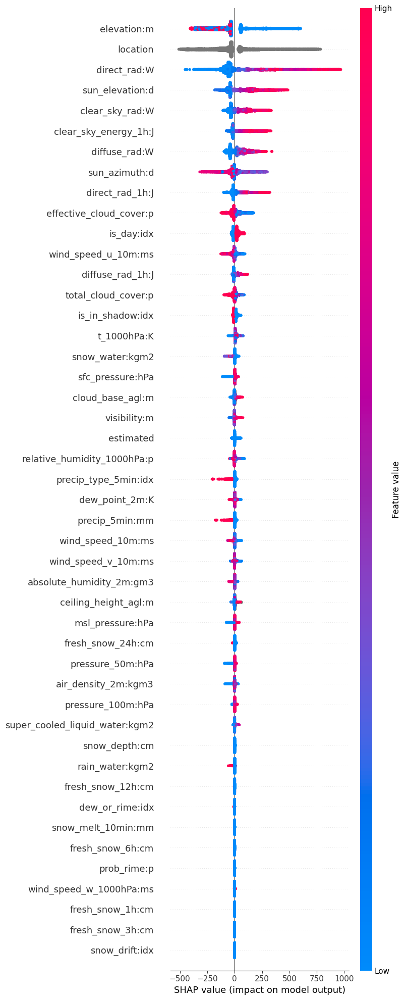

In [70]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In [45]:
catboost_model_avg.get_feature_importance()

array([5.00914709e-01, 4.14089368e-01, 6.42811992e-01, 4.48045039e+00,
       3.79039349e+00, 4.68435661e-01, 2.35246068e-04, 6.68198240e-01,
       1.30795641e+00, 1.35400612e+00, 1.19537307e+01, 4.85610594e+00,
       3.20396394e+00, 2.69825175e+01, 2.17821206e-02, 6.38820606e-05,
       2.42034762e-01, 3.04123663e-05, 3.98154160e-03, 2.19615105e-02,
       3.10139302e-02, 4.00686322e-01, 3.04059102e-01, 3.13047390e-01,
       2.06536476e-01, 2.17277913e-01, 2.13785427e-04, 4.12417466e-02,
       5.14193211e-01, 4.12503200e-01, 4.56111884e-02, 0.00000000e+00,
       7.79043306e-03, 3.51714471e-01, 2.56160394e+00, 8.27235165e+00,
       1.23017091e-01, 9.84379147e-01, 2.08802499e+00, 5.03013307e-01,
       4.79507870e-01, 1.70088525e+00, 5.18037047e-01, 1.38945921e-03,
       1.11185068e-01, 1.88970521e+01])

For the second model in stack

In [71]:
shap_values = catboost_model_non_avg.get_feature_importance(test_pool_non_avg ,type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

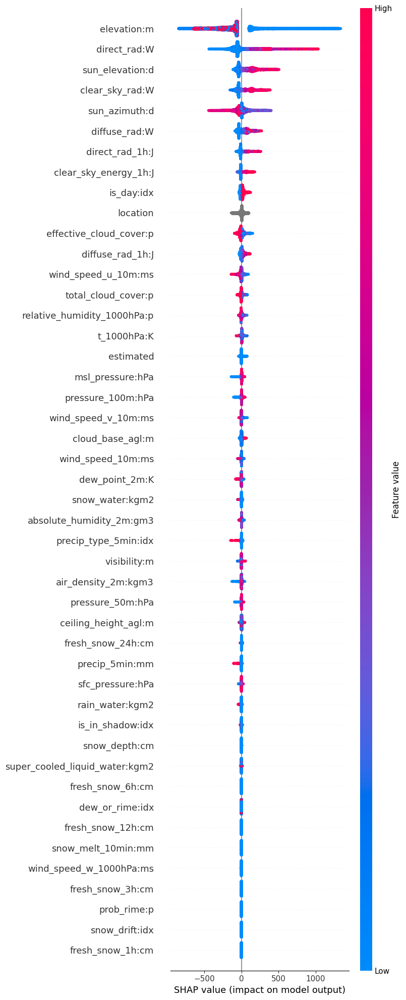

In [72]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In [48]:
catboost_model_non_avg.get_feature_importance()

array([4.72592899e-01, 4.41204367e-01, 3.84270690e-01, 2.10027644e+00,
       6.59232391e+00, 5.12073235e-01, 4.20970309e-04, 6.54575329e-01,
       1.23954700e+00, 7.62895522e-01, 1.26428425e+01, 5.33669134e+00,
       2.00509473e+00, 4.65390852e+01, 9.04155075e-03, 0.00000000e+00,
       2.35266493e-01, 9.80361685e-05, 8.22728932e-03, 3.84898460e-02,
       9.08180785e-02, 5.32835508e-01, 1.89160001e-01, 2.02757084e-01,
       4.05391975e-01, 3.17490715e-01, 1.42871927e-06, 2.04189961e-01,
       1.34250717e+00, 2.04729946e-01, 5.97507981e-02, 0.00000000e+00,
       2.12119598e-03, 1.43597432e-01, 5.77122856e+00, 3.95295454e+00,
       4.82876996e-02, 1.23904967e+00, 1.58323040e+00, 1.14037688e+00,
       3.30905708e-01, 1.17824748e+00, 4.07264867e-01, 1.95389108e-03,
       1.79484175e-01, 4.96647498e-01])

#### third model in stack

In [73]:
shap_values = catboost_model_avg_no_lows.get_feature_importance(test_pool_non_avg, type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

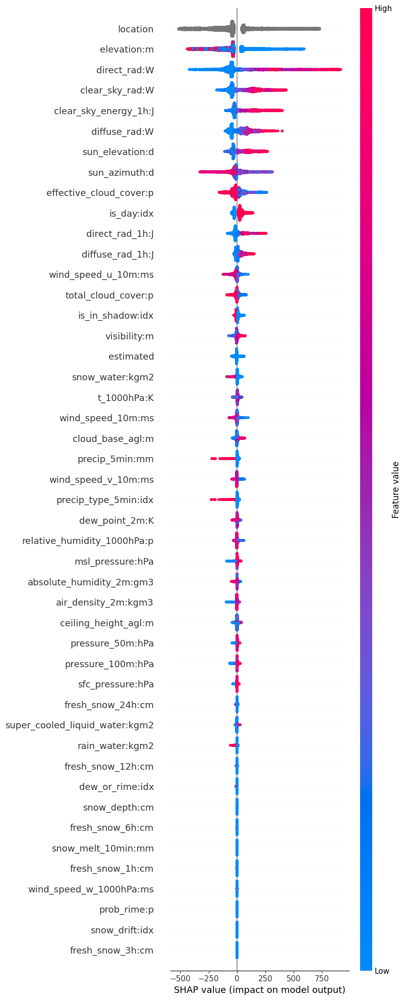

In [74]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In [52]:
catboost_model_avg_no_lows.get_feature_importance()

array([5.46260535e-01, 6.17985385e-01, 5.10588823e-01, 4.49195853e+00,
       8.16091796e+00, 5.84137639e-01, 9.13167605e-04, 6.66333190e-01,
       1.07349894e+00, 7.55320730e-01, 1.24217963e+01, 3.40596918e+00,
       4.76596516e+00, 2.14672502e+01, 6.09115252e-02, 6.42067817e-04,
       1.42185630e-01, 0.00000000e+00, 3.38707106e-03, 2.41861861e-02,
       4.89847023e-02, 4.29232196e-01, 3.87069006e-01, 3.13581371e-01,
       2.82383089e-01, 2.21144537e-01, 7.64855344e-05, 4.90636751e-02,
       4.66616576e-01, 1.94700421e-01, 4.61450411e-02, 0.00000000e+00,
       9.33380052e-03, 4.28684795e-01, 2.87947636e+00, 3.09263747e+00,
       1.41650395e-01, 7.74990347e-01, 1.07776100e+00, 8.45917289e-01,
       5.48803458e-01, 1.22388604e+00, 5.11103697e-01, 4.71389978e-04,
       1.69105089e-01, 2.61569736e+01])

For the location per location with non avg data with best perviously found hyperparams (4 model in stack)

In [75]:
shap_values = catboost_model_a.get_feature_importance(test_pool_non_avg, type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

In [57]:
catboost_model_a.get_feature_importance()

array([1.27447006e+00, 1.18656795e+00, 1.74132104e+00, 7.56339329e+00,
       9.44724614e+00, 1.83414512e+00, 7.42812979e-04, 1.51738460e+00,
       4.21568494e+00, 3.58477004e+00, 1.16109407e+01, 1.03095746e+01,
       7.84536061e+00, 0.00000000e+00, 6.02745185e-02, 1.32801328e-07,
       2.16444962e-01, 1.50447710e-03, 1.81038133e-02, 6.03751846e-02,
       4.03100475e-02, 1.00358046e+00, 3.43978190e-01, 2.41686986e-01,
       9.85865344e-01, 9.65308154e-01, 1.31472254e-03, 6.27358813e-02,
       1.69227329e+00, 1.08165051e+00, 4.39415889e-02, 0.00000000e+00,
       7.20751823e-04, 7.13905657e-01, 1.06643221e+01, 5.84760813e+00,
       3.80088890e-01, 1.99529375e+00, 3.23388043e+00, 2.01535718e+00,
       1.59490003e+00, 2.63083547e+00, 1.84157056e+00, 1.43927590e-04,
       1.30422974e-01])

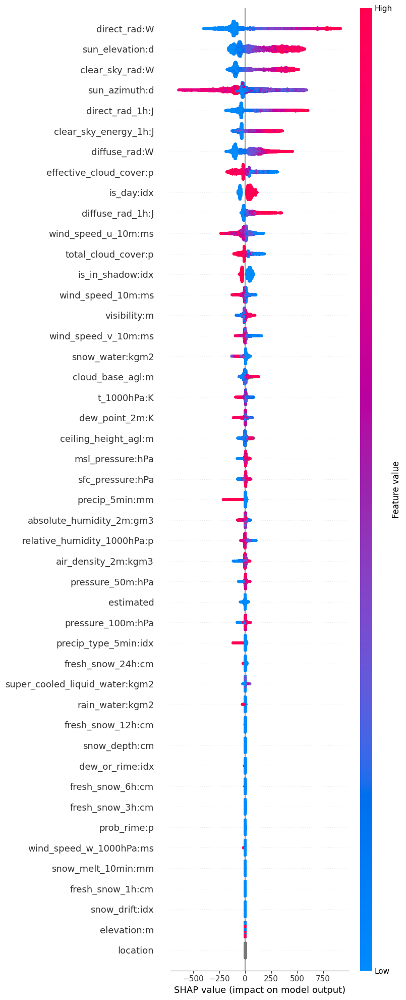

In [76]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In [56]:
shap_values = catboost_model_b.get_feature_importance(test_pool_non_avg, type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

shap.initjs()
shap.force_plot(expected_value, shap_values[0,:], X_test.iloc[0,:])

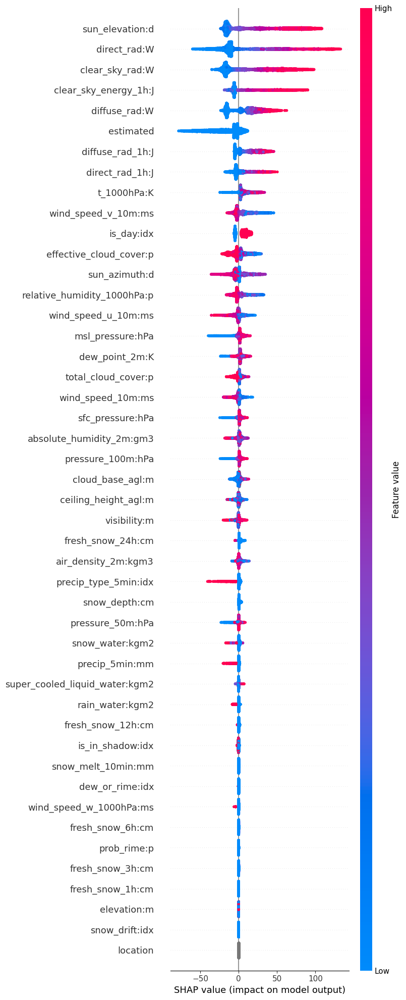

In [60]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In [59]:
shap_values = catboost_model_c.get_feature_importance(test_pool_non_avg, type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

shap.initjs()
shap.force_plot(expected_value, shap_values[0,:], X_test.iloc[0,:])

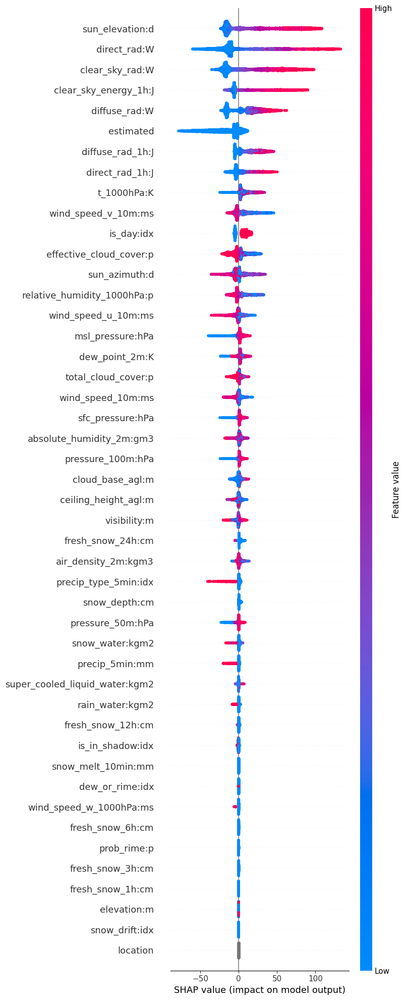

In [61]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In [62]:
catboost_model_c.get_feature_importance()

array([2.14068020e+00, 1.50305898e+00, 2.27697556e+00, 7.58269547e+00,
       1.08992484e+01, 1.86820241e+00, 3.06739945e-04, 2.47569044e+00,
       3.09569781e+00, 2.93226302e+00, 1.08384309e+01, 4.41012309e+00,
       3.43608319e+00, 0.00000000e+00, 1.77401164e-01, 9.00716811e-09,
       1.08642372e+00, 2.38520551e-04, 3.94581821e-03, 2.43198367e-02,
       1.09047779e-01, 1.81487856e+00, 1.71824023e-01, 3.03416452e-01,
       1.64966123e+00, 1.14217159e+00, 1.01691239e-04, 1.12417087e-01,
       2.86473237e+00, 1.73931338e+00, 2.46164638e-01, 0.00000000e+00,
       2.73982753e-02, 5.68489584e-01, 6.12432190e+00, 8.16060228e+00,
       6.15101063e-01, 4.66480873e+00, 1.92436228e+00, 2.89689551e+00,
       2.34776498e+00, 3.24127409e+00, 3.43326402e+00, 2.46129016e-02,
       1.06559026e+00])

# for the last models in the stack

In [63]:
shap_values = catboost_model_avg_a_best_hyper.get_feature_importance(test_pool_avg_c_best_hyper, type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]


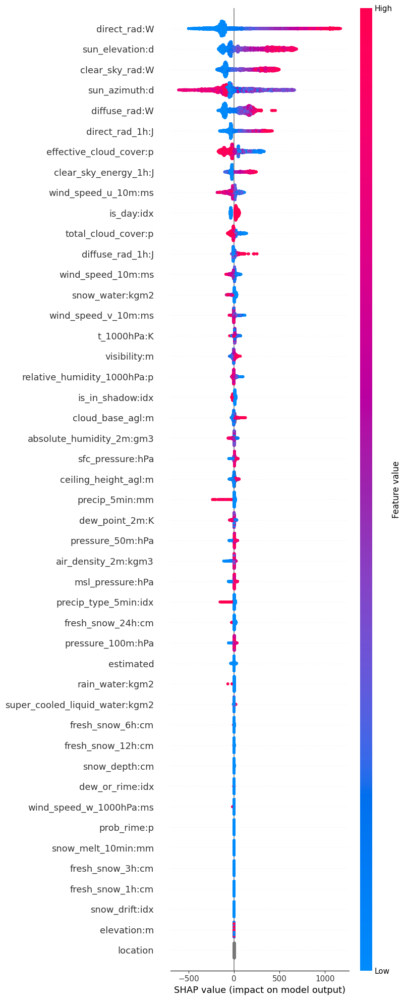

In [64]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In [65]:
shap_values = catboost_model_avg_b_best_hyper.get_feature_importance(test_pool, type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

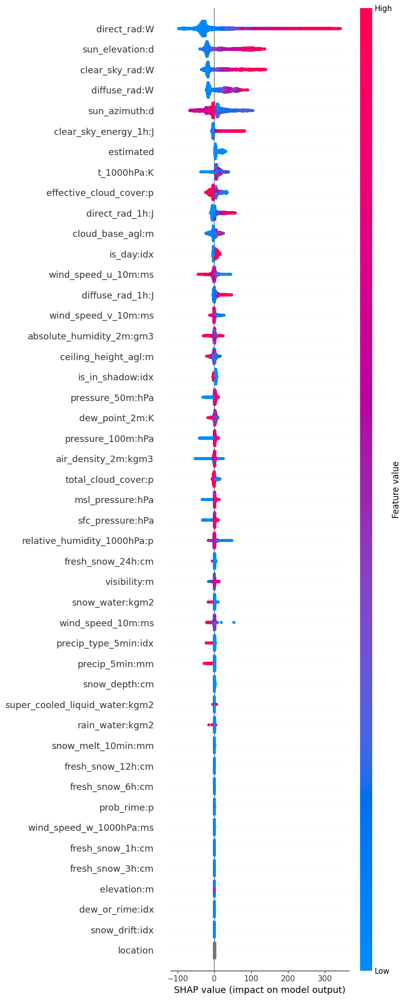

In [66]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In [67]:
shap_values = catboost_model_avg_c_best_hyper.get_feature_importance(test_pool_avg, type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

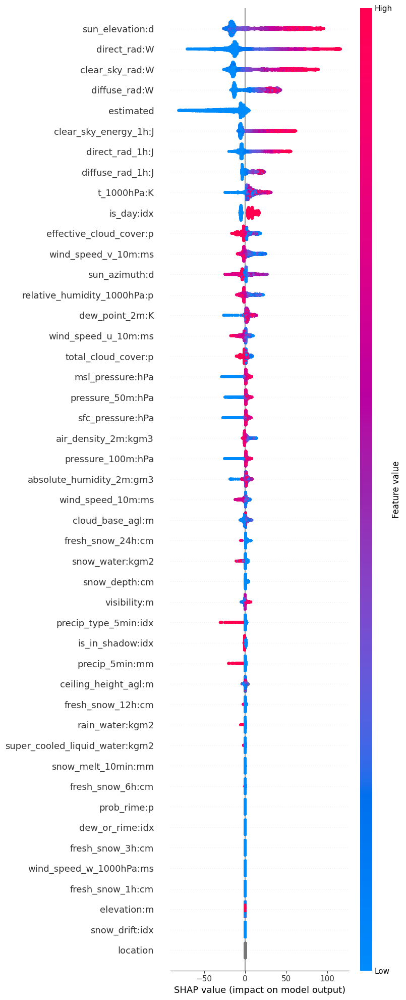

In [68]:
shap.summary_plot(shap_values, X_test, max_display=X_test.shape[1])

In general all the models inteprret the features somewhat equally. Its worth noting that models for location per location weight heavily on direct rad and sun elevation, while in the models using the combined datasets they weight hevily on location and elevation.
Its also worth noting that the models using averaged data place less of an importance on location